## 1. Data Processing

#### Check bus data


In [29]:
import pandas as pd
import json

# Read json files
with open('data/bus/mta_ridership_selected_months_2024.json', 'r') as f:
    selected_months_data = json.load(f)

with open('data/bus/january_supplement.json', 'r') as f:
    january_supplement_data = json.load(f)

with open('data/bus/april_supplement.json', 'r') as f:
    april_supplement_data = json.load(f)

# convert to DataFrame
df_selected = pd.DataFrame(selected_months_data)
df_january = pd.DataFrame(january_supplement_data)
df_april = pd.DataFrame(april_supplement_data)

# check the information of 3 DataFrames
print(f"There are {len(df_selected)} records in main records.")
print(f"There are {len(df_january)} records in january supplement records.")
print(f"There are {len(df_april)} records in april supplement records.")

There are 5231176 records in main records.
There are 476400 records in january supplement records.
There are 457344 records in april supplement records.


In [30]:
print(df_selected.head())
print(df_january.head())
print(df_april.head())

         transit_timestamp bus_route payment_method    fare_class_category  \
0  2024-01-01T00:00:00.000       S52           omny       OMNY - Full Fare   
1  2024-01-01T00:00:00.000       B36      metrocard      Metrocard - Other   
2  2024-01-01T00:00:00.000       B37           omny       OMNY - Full Fare   
3  2024-01-01T00:00:00.000       B45           omny       OMNY - Full Fare   
4  2024-01-01T00:00:00.000      BX13      metrocard  Metrocard - Full Fare   

  ridership transfers  
0         2         1  
1         2         0  
2         2         0  
3         2         0  
4        11         1  
         transit_timestamp bus_route payment_method  \
0  2024-01-29T23:00:00.000       Q48      metrocard   
1  2024-01-29T23:00:00.000       B11      metrocard   
2  2024-01-29T23:00:00.000       B44           omny   
3  2024-01-29T23:00:00.000       B57           omny   
4  2024-01-29T23:00:00.000        B6           omny   

                fare_class_category ridership transfers 

In [31]:
# removal of duplicates between main dataset and January dataset

# record the number of rows of main dataset
initial_rows_main = len(df_selected)

# delete duplicate rows in the main dataset
df_selected_unique = df_selected.drop_duplicates(
    subset=['transit_timestamp', 'bus_route', 'payment_method', 'fare_class_category', 'ridership', 'transfers'])

final_rows_main = len(df_selected_unique)
duplicates_removed_number = initial_rows_main - final_rows_main

print(f"There are {duplicates_removed_number} duplicate records in main records.")

There are 929586 duplicate records in main records.


#### check duplicate records details

In [32]:
# find out duplicate rows, including its first shown
duplicates = df_selected[df_selected.duplicated(
    subset=['transit_timestamp', 'bus_route', 'payment_method', 'fare_class_category', 'ridership', 'transfers'],
    keep=False)]

# merge the duplicate row with df_selected
duplicates_with_pairs = pd.merge(
    duplicates,
    df_selected,
    how='inner',
    on=['transit_timestamp', 'bus_route', 'payment_method', 'fare_class_category', 'ridership', 'transfers'],
    suffixes=('_A', '_B')
)

print(f"Duplicated rows and their matching pairs:\n{duplicates_with_pairs}")

Duplicated rows and their matching pairs:
               transit_timestamp bus_route payment_method fare_class_category  \
0        2024-01-01T00:00:00.000       B36      metrocard   Metrocard - Other   
1        2024-01-01T00:00:00.000       B36      metrocard   Metrocard - Other   
2        2024-01-01T00:00:00.000       B37           omny    OMNY - Full Fare   
3        2024-01-01T00:00:00.000       B37           omny    OMNY - Full Fare   
4        2024-01-01T00:00:00.000       B45           omny    OMNY - Full Fare   
...                          ...       ...            ...                 ...   
3718339  2024-10-06T12:00:00.000      Q52+           omny        OMNY - Other   
3718340  2024-10-06T08:00:00.000       Q58           omny        OMNY - Other   
3718341  2024-10-06T08:00:00.000       Q58           omny        OMNY - Other   
3718342  2024-10-06T13:00:00.000        Q5           omny        OMNY - Other   
3718343  2024-10-06T13:00:00.000        Q5           omny        OM

In [33]:
# calculate the times it duplicates
duplicates_count = duplicates.groupby(
    ['transit_timestamp', 'bus_route', 'payment_method', 'fare_class_category', 'ridership',
     'transfers']).size().reset_index(name='count')

print(f"Duplicated rows and their counts:\n{duplicates_count}")

# check the value of repeat times
count_distribution = duplicates_count['count'].value_counts()

# print all 
print(f"Different counts of repeated rows and their frequencies:\n{count_distribution}")


Duplicated rows and their counts:
              transit_timestamp bus_route payment_method  \
0       2024-01-01T00:00:00.000        B1      metrocard   
1       2024-01-01T00:00:00.000        B1      metrocard   
2       2024-01-01T00:00:00.000        B1      metrocard   
3       2024-01-01T00:00:00.000        B1      metrocard   
4       2024-01-01T00:00:00.000        B1           omny   
...                         ...       ...            ...   
929581  2024-10-08T04:00:00.000     SIM34      metrocard   
929582  2024-10-08T04:00:00.000     SIM34      metrocard   
929583  2024-10-08T04:00:00.000     SIM4C      metrocard   
929584  2024-10-08T04:00:00.000      SIM8      metrocard   
929585  2024-10-08T04:00:00.000      SIM8           omny   

                     fare_class_category ridership transfers  count  
0                  Metrocard - Fair Fare         2         0      2  
1                  Metrocard - Full Fare         1         0      2  
2           Metrocard - Unlimited 3

#### Delete duplicates

In [34]:
df_selected_cleaned = df_selected.drop_duplicates(
    subset=['transit_timestamp', 'bus_route', 'payment_method', 'fare_class_category', 'ridership', 'transfers'],
    keep='first')

print(f"Number of records after deduplication: {len(df_selected_cleaned)}")

Number of records after deduplication: 4301590


In [35]:
duplicates_jan = df_january[df_january.duplicated(subset=['transit_timestamp', 'bus_route', 'payment_method',
                                                          'fare_class_category', 'ridership', 'transfers'], keep=False)]

print(f"Duplicated rows: \n{duplicates_jan}")

Duplicated rows: 
Empty DataFrame
Columns: [transit_timestamp, bus_route, payment_method, fare_class_category, ridership, transfers]
Index: []


In [36]:
duplicates_apr = df_april[df_april.duplicated(subset=['transit_timestamp', 'bus_route', 'payment_method',
                                                      'fare_class_category', 'ridership', 'transfers'], keep=False)]

print(f"Duplicated rows: \n{duplicates_apr}")

Duplicated rows: 
Empty DataFrame
Columns: [transit_timestamp, bus_route, payment_method, fare_class_category, ridership, transfers]
Index: []


In [37]:
# combine 3 after duplicate row check datasets
df_combined = pd.concat([df_selected_cleaned, df_january, df_april], ignore_index=True)

In [38]:
# check df_combined's number of rows
total_rows = len(df_combined)

# find out the duplicate rows
duplicates = df_combined[df_combined.duplicated(
    subset=['transit_timestamp', 'bus_route', 'payment_method', 'fare_class_category', 'ridership', 'transfers'],
    keep=False)]

# exhibit duplicate rows
print(f"Duplicated rows: \n{duplicates}")

# calculate how many times it duplicates
duplicates_count = duplicates.groupby(
    ['transit_timestamp', 'bus_route', 'payment_method', 'fare_class_category', 'ridership',
     'transfers']).size().reset_index(name='count')

print(f"Duplicated rows and their counts:\n{duplicates_count}")

count_distribution = duplicates_count['count'].value_counts()

print(f"Different counts of repeated rows and their frequencies:\n{count_distribution}")

Duplicated rows: 
               transit_timestamp bus_route payment_method  \
572974   2024-01-29T23:00:00.000       B11      metrocard   
572975   2024-01-29T23:00:00.000       B74      metrocard   
572976   2024-01-29T23:00:00.000      BX22      metrocard   
572977   2024-01-29T23:00:00.000      BX34      metrocard   
572978   2024-01-29T23:00:00.000      BX35      metrocard   
...                          ...       ...            ...   
5006602  2024-04-29T23:00:00.000       Q36      metrocard   
5006603  2024-04-29T23:00:00.000        Q5      metrocard   
5006605  2024-04-29T23:00:00.000       Q59      metrocard   
5006627  2024-04-29T23:00:00.000      BX36      metrocard   
5006641  2024-04-29T23:00:00.000       Q28           omny   

                      fare_class_category ridership transfers  
572974   Metrocard - Seniors & Disability         1         0  
572975   Metrocard - Seniors & Disability         1         0  
572976                  Metrocard - Other         2      

In [39]:
df_combined_cleaned = df_combined.drop_duplicates(
    subset=['transit_timestamp', 'bus_route', 'payment_method', 'fare_class_category', 'ridership', 'transfers'],
    keep='first')

print(f"Number of records after deduplication: {len(df_combined_cleaned)}")

Number of records after deduplication: 5190376


In [40]:
# 1. Convert 'transit_timestamp' to datetime format
df_combined_cleaned['transit_timestamp'] = pd.to_datetime(df_combined_cleaned['transit_timestamp'])

# 2. Calculate the time range (earliest and latest dates)
time_range = df_combined_cleaned['transit_timestamp'].min(), df_combined_cleaned['transit_timestamp'].max()
print(f"Time span: {time_range[0]} to {time_range[1]}")

# 3. Group by month and calculate the number of records for each month
df_combined_cleaned['month'] = df_combined_cleaned['transit_timestamp'].dt.to_period('M')
monthly_counts = df_combined_cleaned.groupby('month').size().reset_index(name='count')

# 4. Print the number of records for each month
print(f"Monthly counts:\n{monthly_counts}")


C:\Users\kexun\AppData\Local\Temp\ipykernel_25324\2620823782.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_combined_cleaned['transit_timestamp'] = pd.to_datetime(df_combined_cleaned['transit_timestamp'])


Time span: 2024-01-01 00:00:00 to 2024-10-31 23:00:00
Monthly counts:
     month    count
0  2024-01  1538117
1  2024-02     9528
2  2024-04  1424273
3  2024-07   985495
4  2024-10  1232963


C:\Users\kexun\AppData\Local\Temp\ipykernel_25324\2620823782.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_combined_cleaned['month'] = df_combined_cleaned['transit_timestamp'].dt.to_period('M')


In [41]:
# Remove all rows where the 'month' is '2024-02'
df_combined_cleaned = df_combined_cleaned[df_combined_cleaned['month'] != '2024-02']

# Print the number of records after removal
print(f"Number of records after removing February data: {len(df_combined_cleaned)}")

Number of records after removing February data: 5180848


In [42]:
df_combined_cleaned.head()

,transit_timestamp,bus_route,payment_method,fare_class_category,ridership,transfers,month
0,2024-01-01,S52,omny,OMNY - Full Fare,2,1,2024-01
1,2024-01-01,B36,metrocard,Metrocard - Other,2,0,2024-01
2,2024-01-01,B37,omny,OMNY - Full Fare,2,0,2024-01
3,2024-01-01,B45,omny,OMNY - Full Fare,2,0,2024-01
4,2024-01-01,BX13,metrocard,Metrocard - Full Fare,11,1,2024-01


#### Drop Unnecessary Features

In [43]:
df_combined_cleaned.drop(['transfers', 'payment_method', 'fare_class_category'], axis=1, inplace=True)

In [44]:
df_combined_cleaned.drop('month', axis=1, inplace=True)

In [45]:
df_combined_cleaned.head()

,transit_timestamp,bus_route,ridership
0,2024-01-01,S52,2
1,2024-01-01,B36,2
2,2024-01-01,B37,2
3,2024-01-01,B45,2
4,2024-01-01,BX13,11


In [46]:
df_combined_cleaned.to_csv('df_combined_cleaned_Time_Route_Ridership.csv', index=False)

#### Expand the o'clock timestamp to quarterly, and divide the ridership into 4 pieces

In [19]:
import pandas as pd

# Read the CSV file into a DataFrame
df_combined_cleaned = pd.read_csv('df_combined_cleaned_Time_Route_Ridership.csv')


In [ ]:
# List of time offsets: 0, 15, 30, 45 minutes
expanded_data = []

# Loop through the rows of the original DataFrame to expand by time points
for _, row in df_combined_cleaned.iterrows():
    # Convert the original 'transit_timestamp' to a datetime object
    base_time = pd.to_datetime(row['transit_timestamp'])

    ridership_value = pd.to_numeric(row['ridership'], errors='coerce')  # Convert feature ridership to numeric

    # For each row, generate 4 time points based on the original hour
    # This generates: 00:00, 00:15, 00:30, 00:45 for each original time point
    for minute_offset in [0, 15, 30, 45]:
        new_row = row.copy()  # Create a copy of the current row

        # Modify the time by setting the minute value to the current offset (0, 15, 30, 45)
        new_time = base_time.replace(minute=minute_offset, second=0, microsecond=0)
        new_row['transit_timestamp'] = new_time  # Update with the new time point

        if not pd.isna(ridership_value):
            new_row['ridership'] = ridership_value / 4
        else:
            new_row['ridership'] = 0  # Or handle as you wish for invalid ridership

        # Append the new row to the expanded data list
        expanded_data.append(new_row)

# Convert the expanded data list into a new DataFrame
df_expanded = pd.DataFrame(expanded_data)

# Print the number of rows in the expanded DataFrame
print(f"Number of records after expansion: {len(df_expanded)}")

# Display the first few rows of the expanded DataFrame for verification
print(df_expanded.head())

# Save the expanded DataFrame to a CSV file
df_expanded.to_csv('expanded_df_combined_cleaned.csv', index=False)


### Generate Timetable


In [1]:
import pandas as pd

# 1. Load GTFS files (Make sure the file names match those in your working directory)
stop_times = pd.read_csv("gtfs_m/stop_times.txt", header=None)
stop_times.columns = ['trip_id', 'arrival_time', 'departure_time', 'stop_id', 'stop_sequence', 'pickup_type',
                      'drop_off_type', 'shape_dist_traveled']

stops = pd.read_csv("gtfs_m/stops.txt")
trips = pd.read_csv("gtfs_m/trips.txt")
routes = pd.read_csv("gtfs_m/routes.txt")

# 2. Merge stops (Add stop_name and latitude/longitude)
stop_times = stop_times.merge(
    stops[['stop_id', 'stop_name', 'stop_lat', 'stop_lon']],
    on='stop_id',
    how='left'
)

# 3. Merge trips (Add route_id, service_id, and trip_headsign)
stop_times = stop_times.merge(
    trips[['trip_id', 'route_id', 'service_id', 'trip_headsign']],
    on='trip_id',
    how='left'
)

# 4. Merge routes (Optionally, add route_long_name)
stop_times = stop_times.merge(
    routes[['route_id', 'route_short_name', 'route_long_name']],
    on='route_id',
    how='left'
)

# 5. Keep only the necessary columns for the final timetable
time_table = stop_times[[
    'route_id', 'route_short_name', 'trip_id', 'service_id', 'trip_headsign',
    'stop_sequence', 'stop_id', 'stop_name', 'arrival_time', 'stop_lat', 'stop_lon'
]].copy()

# 6. Clean time data (Filter out invalid times like 24:60:60)
import datetime


def is_valid_time(t):
    try:
        h, m, s = map(int, t.split(":"))
        return 0 <= h < 48 and 0 <= m < 60 and 0 <= s < 60  # Valid time is between 00:00:00 and 47:59:59
    except:
        return False


time_table = time_table[time_table['arrival_time'].apply(is_valid_time)]


# Normalize times like 24:00:00 or 25:30:00 into valid time format
def normalize_time_string(t):
    """Normalize HH:MM:SS string where hour may exceed 23"""
    try:
        h, m, s = map(int, t.split(":"))
        h = h % 24  # Wrap hour to 0–23
        return f"{h:02d}:{m:02d}:{s:02d}"
    except:
        return np.nan


time_table['arrival_time'] = time_table['arrival_time'].apply(normalize_time_string)

# 7. Convert the time to datetime.time object (without date)
time_table['arrival_time_obj'] = pd.to_timedelta(time_table['arrival_time'])

# 8. Sort the timetable by route, trip_id, and stop_sequence
time_table = time_table.sort_values(by=['route_id', 'trip_id', 'stop_sequence'])

# 9. Export the timetable to a CSV file
time_table.to_csv("full_timetable.csv", index=False)
print("Full timetable has been saved as full_timetable.csv")

C:\Users\kexun\AppData\Local\Temp\ipykernel_20220\1238514891.py:4: DtypeWarning: Columns (3,4,5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  stop_times = pd.read_csv("gtfs_m/stop_times.txt", header=None)


Full timetable has been saved as full_timetable.csv


#### Match each swipe record with the swipe location (exact match only)

In [ ]:
import pandas as pd
from datetime import datetime
import numpy as np


# Helper function: Convert time string to seconds (only considering HH:MM:SS)
def time_to_seconds(time_str):
    try:
        # Assume time format is HH:MM:SS
        h, m, s = map(int, time_str.split(':'))
        return h * 3600 + m * 60 + s
    except:
        return np.nan


# Helper function: Find the row with the closest time
def find_nearest_time(group, target_time):
    target_seconds = time_to_seconds(target_time)
    group['time_diff'] = np.abs(group['arrival_time_seconds'] - target_seconds)
    nearest_row = group.loc[group['time_diff'].idxmin()]
    return nearest_row[['stop_lat', 'stop_lon']]


# Read full_timetable.csv
timetable = pd.read_csv('full_timetable.csv')

# Convert arrival_time to seconds for comparison
timetable['arrival_time_seconds'] = timetable['arrival_time'].apply(time_to_seconds)

# Group by route_short_name to speed up matching
timetable_grouped = timetable.groupby('route_short_name')

# Read expanded_df_combined_cleaned.csv in chunks
chunk_size = 100000  # Process 100,000 rows at a time
output_file = 'expanded_df_with_lat_lon_.csv'
first_chunk = True

# Initialize output file
for chunk in pd.read_csv('expanded_df_combined_cleaned.csv', chunksize=chunk_size):
    print(f"Processing chunk with {len(chunk)} rows...")

    # Extract HH:MM:SS from transit_timestamp
    chunk['time_str'] = chunk['transit_timestamp'].str.split(' ').str[1]

    # Initialize latitude and longitude columns
    chunk['latitude'] = np.nan
    chunk['longitude'] = np.nan

    # Match for each bus_route
    for route in chunk['bus_route'].unique():
        if route in timetable_grouped.groups:
            # Get timetable data for the route
            route_timetable = timetable_grouped.get_group(route)

            # Filter rows in chunk for the current route
            route_chunk = chunk[chunk['bus_route'] == route].copy()

            # Find the nearest stop_lat and stop_lon for each row
            for idx, row in route_chunk.iterrows():
                nearest = find_nearest_time(route_timetable, row['time_str'])
                chunk.loc[idx, 'latitude'] = nearest['stop_lat']
                chunk.loc[idx, 'longitude'] = nearest['stop_lon']

    # Save results to CSV
    if first_chunk:
        chunk.to_csv(output_file, mode='w', index=False)
        first_chunk = False
    else:
        chunk.to_csv(output_file, mode='a', header=False, index=False)

print("Processing completed! Output saved to", output_file)

Processing chunk with 100000 rows...


C:\Users\kexun\AppData\Local\Temp\ipykernel_7432\1400393550.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group['time_diff'] = np.abs(group['arrival_time_seconds'] - target_seconds)
C:\Users\kexun\AppData\Local\Temp\ipykernel_7432\1400393550.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group['time_diff'] = np.abs(group['arrival_time_seconds'] - target_seconds)
C:\Users\kexun\AppData\Local\Temp\ipykernel_7432\1400393550.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a

Processing chunk with 100000 rows...


C:\Users\kexun\AppData\Local\Temp\ipykernel_7432\1400393550.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group['time_diff'] = np.abs(group['arrival_time_seconds'] - target_seconds)
C:\Users\kexun\AppData\Local\Temp\ipykernel_7432\1400393550.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group['time_diff'] = np.abs(group['arrival_time_seconds'] - target_seconds)
C:\Users\kexun\AppData\Local\Temp\ipykernel_7432\1400393550.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a

Processing chunk with 100000 rows...


C:\Users\kexun\AppData\Local\Temp\ipykernel_7432\1400393550.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group['time_diff'] = np.abs(group['arrival_time_seconds'] - target_seconds)
C:\Users\kexun\AppData\Local\Temp\ipykernel_7432\1400393550.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group['time_diff'] = np.abs(group['arrival_time_seconds'] - target_seconds)
C:\Users\kexun\AppData\Local\Temp\ipykernel_7432\1400393550.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a

#### Loose match: if no match is found within 15 minutes, discard the record

In [2]:
import pandas as pd
import numpy as np
from datetime import timedelta

# Load data
timetable = pd.read_csv("full_timetable.csv")

# Load expanded_ridership data
expanded_ridership = pd.read_csv("expanded_df_combined_cleaned.csv")

# Preprocess timestamps
expanded_ridership['transit_timestamp'] = pd.to_datetime(
    expanded_ridership['transit_timestamp'], errors='coerce'
)
expanded_ridership['time_only'] = expanded_ridership['transit_timestamp'].dt.time
timetable['arrival_time_obj'] = pd.to_timedelta(timetable['arrival_time'])
timetable['arrival_sec'] = timetable['arrival_time_obj'].dt.total_seconds()

# Build route index
timetable_indexed = {
    route: df.reset_index(drop=True)
    for route, df in timetable.groupby('route_id')
}

# Initialize new columns
expanded_ridership['match_lat'] = np.nan
expanded_ridership['match_lon'] = np.nan

# Number of rows per batch
batch_size = 10000
total_rows = len(expanded_ridership)

# Output file name
output_file = "expanded_df_with_lat_lon__old.csv"

# Clear previous file and write headers
expanded_ridership.iloc[0:0].to_csv(output_file, index=False)

# Process in batches
for start in range(0, total_rows, batch_size):
    end = min(start + batch_size, total_rows)
    batch = expanded_ridership.iloc[start:end].copy()

    print(f"Processing rows {start + 1} to {end} (of {total_rows})")

    for i, row in batch.iterrows():
        route = row['bus_route']
        timestamp = row['transit_timestamp']
        target_sec = timestamp.hour * 3600 + timestamp.minute * 60 + timestamp.second

        matched = False

        if route in timetable_indexed:
            timetable_sub = timetable_indexed[route].copy()
            timetable_sub['diff'] = np.abs(timetable_sub['arrival_sec'] - target_sec)
            best_row = timetable_sub.loc[timetable_sub['diff'].idxmin()]

            if best_row['diff'] <= 900:  # time difference less than 15 minutes
                batch.at[i, 'match_lat'] = best_row['stop_lat']
                batch.at[i, 'match_lon'] = best_row['stop_lon']
                matched = True

        if (i - start) % 1000 == 0 or i == end - 1:
            print(f"  → Row {i + 1}/{end} — Route: {route} — {'√ Matched' if matched else '❌ No match'}")

    # Append this batch to CSV
    batch.to_csv(output_file, mode='a', header=False, index=False)
    print(f"Rows {start + 1} to {end} written to {output_file}")

print(f"All processing completed! Results saved to {output_file}")

Processing rows 1 to 10000 (of 20723392)
  → Row 1/10000 — Route: S52 — ❌ No match
  → Row 1001/10000 — Route: Q52+ — ❌ No match
  → Row 2001/10000 — Route: M11 — √ Matched
  → Row 3001/10000 — Route: B41 — ❌ No match
  → Row 4001/10000 — Route: B65 — ❌ No match
  → Row 5001/10000 — Route: Q17 — ❌ No match
  → Row 6001/10000 — Route: B82 — ❌ No match
  → Row 7001/10000 — Route: B45 — ❌ No match
  → Row 8001/10000 — Route: QM7 — ❌ No match
  → Row 9001/10000 — Route: M86+ — √ Matched
  → Row 10000/10000 — Route: BX21 — ❌ No match
Rows 1 to 10000 written to expanded_df_with_lat_lon.csv
Processing rows 10001 to 20000 (of 20723392)
  → Row 10001/20000 — Route: BX27 — ❌ No match
  → Row 11001/20000 — Route: S55 — ❌ No match
  → Row 12001/20000 — Route: M15 — √ Matched
  → Row 13001/20000 — Route: Q24 — ❌ No match
  → Row 14001/20000 — Route: BX35 — ❌ No match
  → Row 15001/20000 — Route: S59 — ❌ No match
  → Row 16001/20000 — Route: Q65 — ❌ No match
  → Row 17001/20000 — Route: B6 — ❌ No ma

#### Delete empty rows

In [5]:
import pandas as pd

# 1. Read the CSV file
df = pd.read_csv("expanded_df_with_lat_lon_.csv")

# 2. Remove rows where both match_lat and match_lon are missing
df_cleaned_V0 = df[~(df['latitude'].isna() & df['longitude'].isna())]

# 3. Print the number of remaining rows
print("Remaining rows:", len(df_cleaned_V0))

Remaining rows: 2162520


In [2]:
df_cleaned_V0.to_csv("bus_records_with_time+np+loc+216.csv", index=False)

In [6]:
import pandas as pd

# 1. Read the CSV file
df = pd.read_csv("expanded_df_with_lat_lon__old.csv")

# 2. Remove rows where both latitude and longitude are missing
df_cleaned_V1 = df[~(df['match_lat'].isna() & df['match_lon'].isna())]

# 3. Print the number of remaining rows
print("Remaining rows:", len(df_cleaned_V1))

Remaining rows: 2759638


In [6]:
df_cleaned_V1.to_csv("bus_records_with_time+np+loc+275.csv", index=False)

In [7]:
# check the number of records in each month
import pandas as pd

# Read the data
df = pd.read_csv("bus_records_with_time+np+loc+216.csv")

# Convert transit_timestamp to datetime type
df["transit_timestamp"] = pd.to_datetime(df["transit_timestamp"])

# Extract the month
df["month"] = df["transit_timestamp"].dt.month

# Count the number of records for each month
month_counts = df["month"].value_counts().sort_index()

# Print the result
print("Number of records per month:")
print(month_counts)

Number of records per month:
month
1     612447
4     568620
7     441309
10    540144
Name: count, dtype: int64


### Processing Subway data

In [8]:
import pandas as pd

# 1. Read the CSV file
df = pd.read_csv("data/MTA_Subway_Hourly_Ridership__2024Apr.csv")

# 2. Check for duplicate rows
duplicates = df[df.duplicated()]

# 3. Output the number of duplicate rows
print(f"Number of duplicate rows: {len(duplicates)}")

print(duplicates)

Number of duplicate rows: 0
Empty DataFrame
Columns: [transit_timestamp, transit_mode, station_complex_id, station_complex, borough, payment_method, fare_class_category, ridership, transfers, latitude, longitude, Georeference]
Index: []


In [9]:
import pandas as pd

# Read the CSV file
df = pd.read_csv("data/MTA_Subway_Hourly_Ridership__2024Jan.csv")

# Check for duplicate rows
duplicates = df[df.duplicated()]

# Print the number of duplicate rows
print(f"Number of duplicate rows: {len(duplicates)}")

print(duplicates)

Number of duplicate rows: 0
Empty DataFrame
Columns: [transit_timestamp, transit_mode, station_complex_id, station_complex, borough, payment_method, fare_class_category, ridership, transfers, latitude, longitude, Georeference]
Index: []


In [10]:
import pandas as pd

# Read the CSV file
df = pd.read_csv("data/MTA_Subway_Hourly_Ridership__2024Jul.csv")

# Check for duplicate rows
duplicates = df[df.duplicated()]

# Print the number of duplicate rows
print(f"Number of duplicate rows: {len(duplicates)}")

print(duplicates)

Number of duplicate rows: 0
Empty DataFrame
Columns: [transit_timestamp, transit_mode, station_complex_id, station_complex, borough, payment_method, fare_class_category, ridership, transfers, latitude, longitude, Georeference]
Index: []


In [11]:
import pandas as pd

# Read the CSV file
df = pd.read_csv("data/MTA_Subway_Hourly_Ridership__2024Oct.csv")

# Check for duplicate rows
duplicates = df[df.duplicated()]

# Print the number of duplicate rows
print(f"Number of duplicate rows: {len(duplicates)}")

print(duplicates)

C:\Users\kexun\AppData\Local\Temp\ipykernel_18280\4107867142.py:4: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("data/MTA_Subway_Hourly_Ridership__2024Oct.csv")


Number of duplicate rows: 0
Empty DataFrame
Columns: [transit_timestamp, transit_mode, station_complex_id, station_complex, borough, payment_method, fare_class_category, ridership, transfers, latitude, longitude, Georeference]
Index: []


In [12]:
import pandas as pd

# Define file paths for the four CSV files
files = [
    "data/MTA_Subway_Hourly_Ridership__2024Jan.csv",
    "data/MTA_Subway_Hourly_Ridership__2024Apr.csv",
    "data/MTA_Subway_Hourly_Ridership__2024Jul.csv",
    "data/MTA_Subway_Hourly_Ridership__2024Oct.csv"
]

# Read and concatenate them into a single DataFrame
subway = pd.concat([pd.read_csv(f) for f in files], ignore_index=True)

# Save the combined data as a new CSV file
subway.to_csv("MTA_Subway_Hourly_Ridership__2024_All.csv", index=False)

# Print the total number of rows after merging
print("Total number of rows after merge:", len(subway))

C:\Users\kexun\AppData\Local\Temp\ipykernel_18280\651131857.py:12: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  subway = pd.concat([pd.read_csv(f) for f in files], ignore_index=True)


Total number of rows after merge: 2780263


In [13]:
import pandas as pd

subway = pd.read_csv('MTA_Subway_Hourly_Ridership__2024_All.csv')  

C:\Users\kexun\AppData\Local\Temp\ipykernel_18280\2613364876.py:3: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  subway = pd.read_csv('MTA_Subway_Hourly_Ridership__2024_All.csv')


In [14]:
subway.head()

,transit_timestamp,transit_mode,station_complex_id,station_complex,borough,payment_method,fare_class_category,ridership,transfers,latitude,longitude,Georeference
0,01/25/2024 05:00:00 PM,subway,403,33 St (6),Manhattan,omny,OMNY - Full Fare,1644,16,40.746082,-73.982080,POINT (-73.98208 40.746082)
1,01/24/2024 08:00:00 PM,subway,438,"135 St (2,3)",Manhattan,omny,OMNY - Full Fare,40,0,40.814228,-73.940770,POINT (-73.94077 40.814228)
2,01/31/2024 05:00:00 AM,subway,477,72 St (Q),Manhattan,omny,OMNY - Full Fare,24,0,40.768800,-73.958430,POINT (-73.95843 40.7688)
3,01/31/2024 03:00:00 PM,subway,309,103 St (1),Manhattan,omny,OMNY - Full Fare,236,1,40.799446,-73.968376,POINT (-73.968376 40.799446)
4,01/12/2024 07:00:00 PM,subway,224,57 St (F),Manhattan,omny,OMNY - Full Fare,188,1,40.763973,-73.977450,POINT (-73.97745 40.763973)


In [15]:
# drop unnecessary features

subway = subway.drop(columns=[
    'transit_mode',
    'borough',
    'payment_method',
    'fare_class_category',
    'transfers',
    'Georeference'
], errors='ignore')
subway.head()

,transit_timestamp,station_complex_id,station_complex,ridership,latitude,longitude
0,01/25/2024 05:00:00 PM,403,33 St (6),1644,40.746082,-73.982080
1,01/24/2024 08:00:00 PM,438,"135 St (2,3)",40,40.814228,-73.940770
2,01/31/2024 05:00:00 AM,477,72 St (Q),24,40.768800,-73.958430
3,01/31/2024 03:00:00 PM,309,103 St (1),236,40.799446,-73.968376
4,01/12/2024 07:00:00 PM,224,57 St (F),188,40.763973,-73.977450


In [16]:
subway.to_csv("subway_clean.csv", index=False)

In [18]:
# check the number of records in each month

# Read the data
df = pd.read_csv("subway_clean.csv")

# Convert transit_timestamp to datetime type
df["transit_timestamp"] = pd.to_datetime(df["transit_timestamp"])

# Extract the month
df["month"] = df["transit_timestamp"].dt.month

# Count the number of records for each month
month_counts = df["month"].value_counts().sort_index()

# Print the result
print("Number of records per month:")
print(month_counts)

C:\Users\kexun\AppData\Local\Temp\ipykernel_18280\3261293089.py:4: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("subway_clean.csv")
C:\Users\kexun\AppData\Local\Temp\ipykernel_18280\3261293089.py:7: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["transit_timestamp"] = pd.to_datetime(df["transit_timestamp"])


Number of records per month:
month
1     675343
4     666263
7     675448
10    763209
Name: count, dtype: int64


#### Grid

In [5]:
import geopandas as gpd

# Load the GDB file and specify the layer
gdf = gpd.read_file("MapPLUTO25v2.gdb", layer="MapPLUTO_25v2_clipped")

# Display column names
print(gdf.columns)

Index(['Borough', 'Block', 'Lot', 'CD', 'BCT2020', 'BCTCB2020', 'CT2010',
       'CB2010', 'SchoolDist', 'Council', 'ZipCode', 'FireComp', 'PolicePrct',
       'HealthCenterDistrict', 'HealthArea', 'Sanitboro', 'SanitDistrict',
       'SanitSub', 'Address', 'ZoneDist1', 'ZoneDist2', 'ZoneDist3',
       'ZoneDist4', 'Overlay1', 'Overlay2', 'SPDist1', 'SPDist2', 'SPDist3',
       'LtdHeight', 'SplitZone', 'BldgClass', 'LandUse', 'Easements',
       'OwnerType', 'OwnerName', 'LotArea', 'BldgArea', 'ComArea', 'ResArea',
       'OfficeArea', 'RetailArea', 'GarageArea', 'StrgeArea', 'FactryArea',
       'OtherArea', 'AreaSource', 'NumBldgs', 'NumFloors', 'UnitsRes',
       'UnitsTotal', 'LotFront', 'LotDepth', 'BldgFront', 'BldgDepth', 'Ext',
       'ProxCode', 'IrrLotCode', 'LotType', 'BsmtCode', 'AssessLand',
       'AssessTot', 'ExemptTot', 'YearBuilt', 'YearAlter1', 'YearAlter2',
       'HistDist', 'Landmark', 'BuiltFAR', 'ResidFAR', 'CommFAR', 'FacilFAR',
       'BoroCode', 'BBL', 'Cond

In [11]:
import geopandas as gpd

gdf = gpd.read_file("MapPLUTO25v2.gdb", layer="MapPLUTO_25v2_clipped")
print(gdf["Borough"].unique())

['MN' 'BX' 'BK' 'QN' 'SI']


In [1]:
import geopandas as gpd

# Read the extracted .gdb folder (full path)
gdf = gpd.read_file("MapPLUTO25v2.gdb", layer="MapPLUTO_25v2_clipped")

# Keep only Manhattan data (BoroName is usually the field, or check for Borough or BoroCode)
manhattan = gdf[gdf["Borough"] == "MN"]

# Dissolve into a single Polygon (instead of multiple parcels)
manhattan_bounds = manhattan.dissolve(by="Borough")

# Save as geojson
manhattan_bounds.to_file("manhattan.geojson", driver="GeoJSON")

In [2]:
# Coordinate Reference System (CRS) transformation: from EPSG:2263 to WGS84 (EPSG:4326) ===
manhattan_bounds_wgs84 = manhattan_bounds.to_crs("EPSG:4326")

# Save as a new GeoJSON file (in latitude and longitude coordinates) ===
manhattan_bounds_wgs84.to_file("manhattan_wgs84.geojson", driver="GeoJSON")

C:\Users\kexun\AppData\Local\Temp\ipykernel_18280\1911903991.py:13: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  true_area = manhattan_bounds.unary_union.area


Estimated square grid side length (meters): 513.02 m
Number of grid cells after clipping: 508


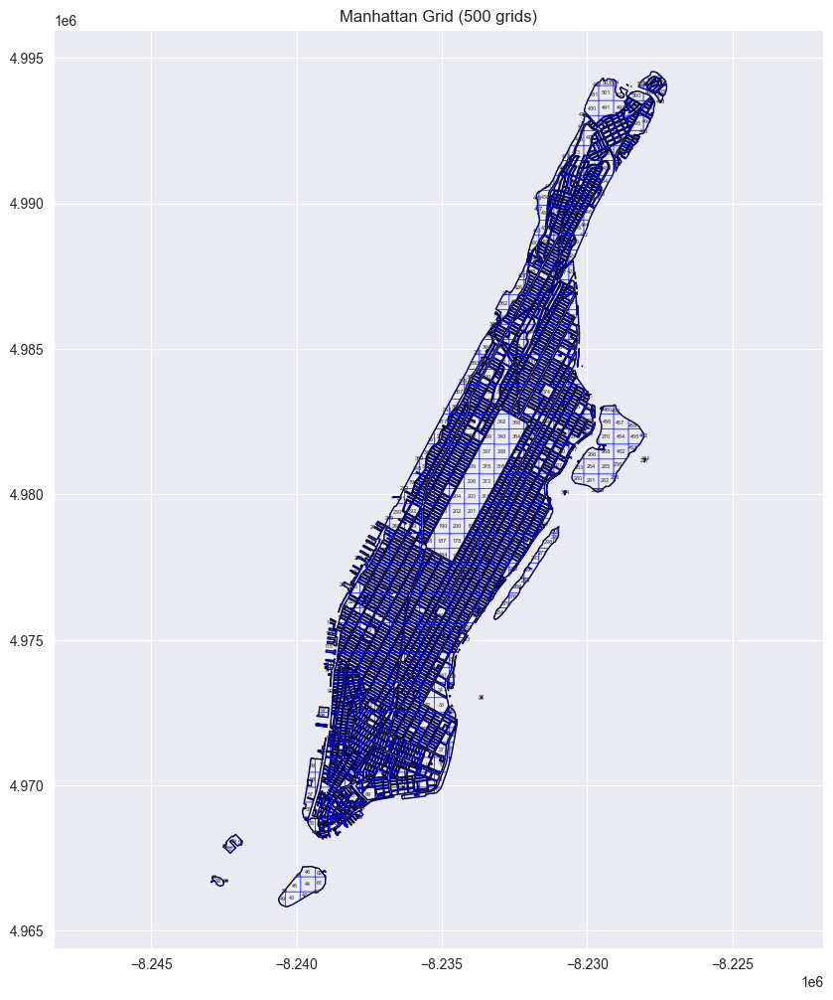

In [25]:
import geopandas as gpd
from shapely.geometry import box
import numpy as np
import matplotlib.pyplot as plt

# 1. Read Manhattan boundary already in WGS84 coordinates
manhattan_bounds = gpd.read_file("manhattan_wgs84.geojson")

# 2. Project to metric coordinate system (EPSG:3857) for accurate area and grid size calculation
manhattan_bounds = manhattan_bounds.to_crs("EPSG:3857")

# 3. Calculate the true area of Manhattan (in square meters)
true_area = manhattan_bounds.unary_union.area

# 4. Set the target number of grid cells
target_cells = 280

# 5. Calculate the side length of square cells (in meters)
side_length_m = np.sqrt(true_area / target_cells)
print(f"Estimated square grid side length (meters): {side_length_m:.2f} m")

# 6. Build grid
xmin, ymin, xmax, ymax = manhattan_bounds.total_bounds
cols = np.arange(xmin, xmax, side_length_m)
rows = np.arange(ymin, ymax, side_length_m)

polygons = []
for x in cols:
    for y in rows:
        polygons.append(box(x, y, x + side_length_m, y + side_length_m))

grid = gpd.GeoDataFrame({'geometry': polygons}, crs=manhattan_bounds.crs)

# 7. Clip grid to boundary
grid_clipped = gpd.clip(grid, manhattan_bounds)

# 8. Add grid IDs
grid_clipped["grid_id"] = range(1, len(grid_clipped) + 1)

# 9. Print number of resulting grid cells
print("Number of grid cells after clipping:", len(grid_clipped))

# 10. Visualization and save as JPG
fig, ax = plt.subplots(figsize=(10, 12))
manhattan_bounds.boundary.plot(ax=ax, color='black', linewidth=1)
grid_clipped.boundary.plot(ax=ax, edgecolor='blue', linewidth=0.3)

# Annotate grid IDs at the centroid of each cell
for idx, row in grid_clipped.iterrows():
    centroid = row.geometry.centroid
    ax.text(centroid.x, centroid.y, str(row.grid_id), fontsize=4, ha='center', va='center')

plt.title("Manhattan Grid (500 grids)")
plt.axis('equal')
plt.savefig("manhattan_grid_with_ids.jpg", dpi=300)
plt.show()

#### Split square grids into four smaller squares + Delete grids outside the Manhattan area

Loaded filtered grid with 504 cells
Found 357 square grids and 147 non-square grids
Number of new grid cells after splitting: 1573
Saved split grid to manhattan_grid_split.geojson


C:\Users\kexun\AppData\Local\Temp\ipykernel_20220\2899611258.py:68: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids['geometry'] = centroids['geometry'].centroid


Saved centroids to manhattan_grid_split_centroids.csv


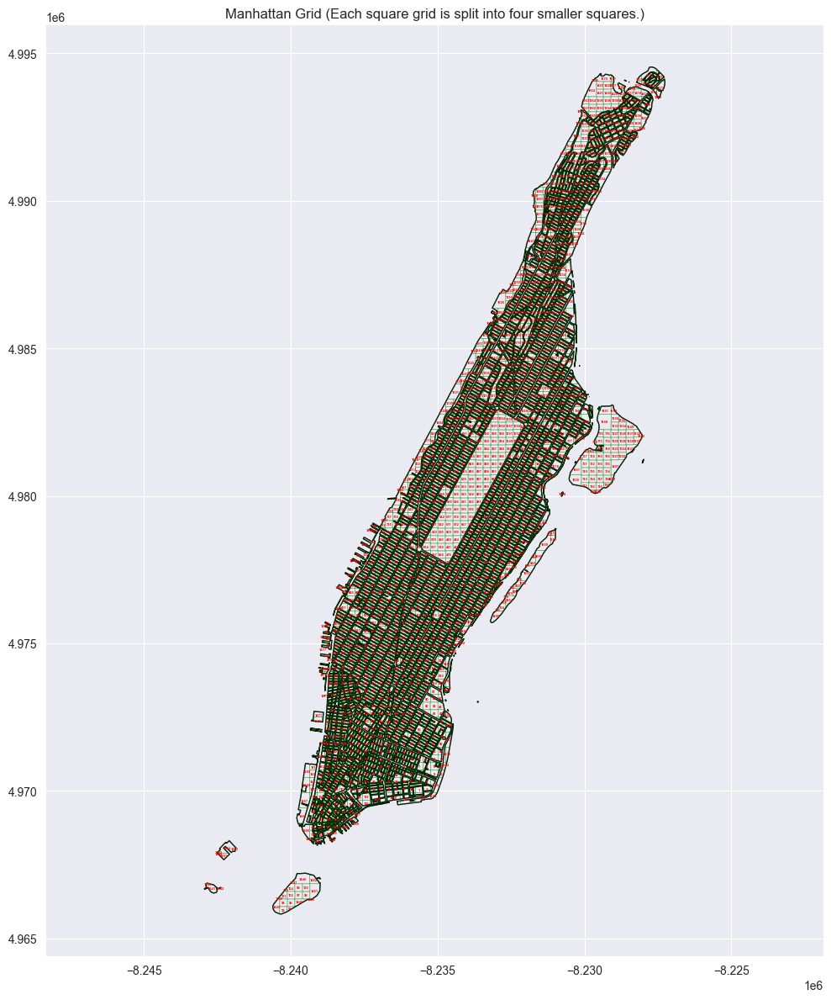

Sample of new grid IDs: [1227, 182, 524, 1488, 476]
Total new grid cells: 1573
Sample of centroid CSV:
       grid_id  longitude   latitude
92         93 -74.023495  40.684888
93         94 -74.021417  40.685266
1448     1449 -74.025423  40.685646
1444     1445 -74.018514  40.686794
95         96 -74.021116  40.686540


In [2]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import box
import numpy as np
import matplotlib.pyplot as plt

# 1. Read filtered grid (EPSG:3857)
grid_filtered = gpd.read_file("manhattan_grid_filtered.geojson")
manhattan_bounds = gpd.read_file("manhattan_wgs84.geojson").to_crs("EPSG:3857")
print("Loaded filtered grid with", len(grid_filtered), "cells")

# 2. Identify complete square grids
def is_square(geom, tolerance=1e-6):
    x_min, y_min, x_max, y_max = geom.bounds
    width = x_max - x_min
    height = y_max - y_min
    return abs(width - height) < tolerance and width > 0

square_grids = grid_filtered[grid_filtered['geometry'].apply(is_square)]
non_square_grids = grid_filtered[~grid_filtered['geometry'].apply(is_square)]
print(f"Found {len(square_grids)} square grids and {len(non_square_grids)} non-square grids")

# 3. Split square grids into four smaller squares
def split_square_grid(geom, original_id):
    x_min, y_min, x_max, y_max = geom.bounds
    width = (x_max - x_min) / 2
    new_polygons = [
        box(x_min, y_min, x_min + width, y_min + width),          # Bottom-left
        box(x_min + width, y_min, x_max, y_min + width),          # Bottom-right
        box(x_min, y_min + width, x_min + width, y_max),          # Top-left
        box(x_min + width, y_min + width, x_max, y_max)           # Top-right
    ]
    return new_polygons

new_polygons = []
new_grid_ids = []
current_id = 1

# Process square grids
for _, row in square_grids.iterrows():
    split_polygons = split_square_grid(row['geometry'], row['grid_id'])
    for poly in split_polygons:
        new_polygons.append(poly)
        new_grid_ids.append(current_id)
        current_id += 1

# Add non-square grids as-is with new IDs
for _, row in non_square_grids.iterrows():
    new_polygons.append(row['geometry'])
    new_grid_ids.append(current_id)
    current_id += 1

# Create new GeoDataFrame
split_grid = gpd.GeoDataFrame(
    {'grid_id': new_grid_ids, 'geometry': new_polygons},
    crs=grid_filtered.crs
)
split_grid = gpd.clip(split_grid, manhattan_bounds)
print("Number of new grid cells after splitting:", len(split_grid))

# 4. Save split grid to GeoJSON
split_grid.to_file("manhattan_grid_split.geojson", driver="GeoJSON")
print("Saved split grid to manhattan_grid_split.geojson")

# 5. Calculate centroids and convert to WGS84
split_grid_wgs84 = split_grid.to_crs("EPSG:4326")
centroids = split_grid_wgs84.copy()
centroids['geometry'] = centroids['geometry'].centroid
centroids['longitude'] = centroids['geometry'].x
centroids['latitude'] = centroids['geometry'].y

# Create CSV with grid_id, longitude, latitude
centroid_df = pd.DataFrame({
    'grid_id': centroids['grid_id'],
    'longitude': centroids['longitude'],
    'latitude': centroids['latitude']
})
centroid_df.to_csv("manhattan_grid_split_centroids.csv", index=False)
print("Saved centroids to manhattan_grid_split_centroids.csv")

# 6. Plot split grid for verification
fig, ax = plt.subplots(figsize=(10, 12))
manhattan_bounds.boundary.plot(ax=ax, color='black', linewidth=1)
split_grid.boundary.plot(ax=ax, edgecolor='green', linewidth=0.2)

# Draw centroid labels centered
for _, row in split_grid.iterrows():
    centroid = row['geometry'].centroid
    ax.text(
        centroid.x,
        centroid.y,
        str(row['grid_id']),
        fontsize=3,
        color='red',
        ha='center',
        va='center',
        weight='bold'
    )

plt.title("Manhattan Grid (Each square grid is split into four smaller squares.)")
plt.axis('equal')
plt.tight_layout()
plt.savefig("manhattan_grid_split.png", dpi=300)
plt.show()

# 7. Verify grid counts
print("Sample of new grid IDs:", split_grid['grid_id'].sample(5).tolist())
print("Total new grid cells:", len(split_grid))
print("Sample of centroid CSV:\n", centroid_df.head())

### Put taxi records into grids

In [27]:
import pandas as pd

# Define list of file names
files = [
    "data/yellow_tripdata_2024-01.parquet",
    "data/yellow_tripdata_2024-04.parquet",
    "data/yellow_tripdata_2024-07.parquet",
    "data/yellow_tripdata_2024-10.parquet"
]

# Read each file and concatenate into a single DataFrame
yellow_trips = pd.concat([pd.read_parquet(f) for f in files], ignore_index=True)

# Output number of rows and column names
print("Number of rows after merge:", len(yellow_trips))
print("Column names preview:", yellow_trips.columns.tolist())

Number of rows after merge: 13389587
Column names preview: ['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime', 'passenger_count', 'trip_distance', 'RatecodeID', 'store_and_fwd_flag', 'PULocationID', 'DOLocationID', 'payment_type', 'fare_amount', 'extra', 'mta_tax', 'tip_amount', 'tolls_amount', 'improvement_surcharge', 'total_amount', 'congestion_surcharge', 'Airport_fee']


In [28]:
print(yellow_trips.head())

   VendorID tpep_pickup_datetime tpep_dropoff_datetime  passenger_count  \
0         2  2024-01-01 00:57:55   2024-01-01 01:17:43              1.0   
1         1  2024-01-01 00:03:00   2024-01-01 00:09:36              1.0   
2         1  2024-01-01 00:17:06   2024-01-01 00:35:01              1.0   
3         1  2024-01-01 00:36:38   2024-01-01 00:44:56              1.0   
4         1  2024-01-01 00:46:51   2024-01-01 00:52:57              1.0   

   trip_distance  RatecodeID store_and_fwd_flag  PULocationID  DOLocationID  \
0           1.72         1.0                  N           186            79   
1           1.80         1.0                  N           140           236   
2           4.70         1.0                  N           236            79   
3           1.40         1.0                  N            79           211   
4           0.80         1.0                  N           211           148   

   payment_type  fare_amount  extra  mta_tax  tip_amount  tolls_amount  \


In [29]:
# Keep only the following columns
yellow_trips = yellow_trips[[  
    "tpep_pickup_datetime",
    "tpep_dropoff_datetime",
    "passenger_count",
    "PULocationID",
    "DOLocationID"
]]

In [30]:
print(yellow_trips.head())

  tpep_pickup_datetime tpep_dropoff_datetime  passenger_count  PULocationID  \
0  2024-01-01 00:57:55   2024-01-01 01:17:43              1.0           186   
1  2024-01-01 00:03:00   2024-01-01 00:09:36              1.0           140   
2  2024-01-01 00:17:06   2024-01-01 00:35:01              1.0           236   
3  2024-01-01 00:36:38   2024-01-01 00:44:56              1.0            79   
4  2024-01-01 00:46:51   2024-01-01 00:52:57              1.0           211   

   DOLocationID  
0            79  
1           236  
2            79  
3           211  
4           148  


In [31]:
# Fill null values in passenger_count
# Calculate the mode
mode_value = yellow_trips['passenger_count'].mode()[0]

# Fill missing values with the mode
yellow_trips['passenger_count'] = yellow_trips['passenger_count'].fillna(mode_value)

# Check if any missing values remain
print("Remaining missing values:", yellow_trips['passenger_count'].isna().sum())


Remaining missing values: 0


### divide taxi records into grids I generated

In [4]:
from joblib import Parallel, delayed
import pandas as pd
import geopandas as gpd
import numpy as np
from collections import defaultdict
from time import time

# Load grid and TaxiZone data
grid = gpd.read_file("manhattan_grid_split.geojson").to_crs("EPSG:4326").reset_index(drop=True)
grid["grid_id"] = grid.index

taxi_zones = gpd.read_file("data/taxi_zones/taxi_zones.shp").to_crs("EPSG:4326")

# Build TaxiZone → grid_id mapping dictionary 
zone_to_grids = {}
manhattan_union = grid.geometry.union_all()

for _, row in taxi_zones.iterrows():
    zone_id = row["LocationID"]
    geom = row.geometry
    if geom.intersects(manhattan_union):  # Only keep zones overlapping Manhattan
        matched_grids = grid[grid.intersects(geom)]["grid_id"].tolist()
        if matched_grids:
            zone_to_grids[zone_id] = matched_grids

# Merge all parquet files and filter relevant records 
files = [
    "data/yellow_tripdata_2024-01.parquet",
    "data/yellow_tripdata_2024-04.parquet",
    "data/yellow_tripdata_2024-07.parquet",
    "data/yellow_tripdata_2024-10.parquet"
]

df_all = pd.concat([pd.read_parquet(f) for f in files], ignore_index=True)

# Keep only relevant columns
df_all = df_all[[
    "tpep_pickup_datetime", "tpep_dropoff_datetime",
    "passenger_count", "PULocationID", "DOLocationID"
]]

# Fill missing values in passenger_count (with mode)
mode_val = df_all["passenger_count"].mode()[0]
df_all["passenger_count"] = df_all["passenger_count"].fillna(mode_val)

# Pre-filter trips related only to Manhattan
valid_zone_ids = set(zone_to_grids.keys())
df_all = df_all[
    df_all["PULocationID"].isin(valid_zone_ids) |
    df_all["DOLocationID"].isin(valid_zone_ids)
].reset_index(drop=True)

print(f"Number of records after filtering: {len(df_all):,}")


# Define processing function to aggregate by hour
def process_block_hourly(block):
    hour_grid_counts = defaultdict(float)
    for _, row in block.iterrows():
        passenger = row["passenger_count"]
        pickup_hour = pd.to_datetime(row["tpep_pickup_datetime"]).floor("H")
        dropoff_hour = pd.to_datetime(row["tpep_dropoff_datetime"]).floor("H")

        pu_grids = zone_to_grids.get(row["PULocationID"])
        if pu_grids:
            share = passenger / len(pu_grids)
            for gid in pu_grids:
                hour_grid_counts[(pickup_hour, gid)] += share

        do_grids = zone_to_grids.get(row["DOLocationID"])
        if do_grids:
            share = passenger / len(do_grids)
            for gid in do_grids:
                hour_grid_counts[(dropoff_hour, gid)] += share
    return hour_grid_counts


# Split into chunks and process in parallel
num_chunks = 8
chunks = np.array_split(df_all, num_chunks)

start = time()
results = Parallel(n_jobs=num_chunks)(
    delayed(process_block_hourly)(chunk) for chunk in chunks
)

# Merge partial defaultdict results
final_counts = defaultdict(float)
for part in results:
    for k, v in part.items():
        final_counts[k] += v

# Convert to DataFrame and save
df_hourly = pd.DataFrame([
    {"hour": k[0], "grid_id": k[1], "passenger_count": v}
    for k, v in final_counts.items()
])

print(f"Aggregation completed, total rows: {len(df_hourly):,}")
print(f"Total time: {time() - start:.2f} seconds")

df_hourly.to_csv("yellow_trip_hourly_grid.csv", index=False)

Number of records after filtering: 12,644,713


E:\softwares\python313\Lib\site-packages\numpy\_core\fromnumeric.py:57: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


Aggregation completed, total rows: 4,373,478
Total time: 173.85 seconds


In [37]:
import pandas as pd

# Read the data
df = pd.read_csv("yellow_trip_hourly_grid.csv")

# Convert the 'hour' column to datetime format
df["hour"] = pd.to_datetime(df["hour"])

# Extract the month
df["month"] = df["hour"].dt.month

# Keep only the records from January, April, July, and October
df = df[df["month"].isin([1, 4, 7, 10])]

# Count the number of records per month
month_counts = df["month"].value_counts().sort_index()

# Print the result
print("Number of records per month:")
print(month_counts)

Number of records per month:
month
1     1087997
4     1067716
7     1098011
10    1104392
Name: count, dtype: int64


In [38]:
df.to_csv("yellow_trip_hourly_grid.csv", index=False)

In [3]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from collections import defaultdict
from joblib import Parallel, delayed
from tqdm import tqdm
import numpy as np

# Read input files
subway_df = pd.read_csv("subway_clean.csv")
grid_df = pd.read_csv("manhattan_grid_split_centroids.csv")

# Convert to GeoDataFrame and project to EPSG:3857
subway_gdf = gpd.GeoDataFrame(
    subway_df,
    geometry=gpd.points_from_xy(subway_df.longitude, subway_df.latitude),
    crs="EPSG:4326"
).to_crs("EPSG:3857")

grid_gdf = gpd.GeoDataFrame(
    grid_df,
    geometry=gpd.points_from_xy(grid_df.longitude, grid_df.latitude),
    crs="EPSG:4326"
).to_crs("EPSG:3857")

# Define processing function
def process_chunk(chunk):
    local_result = defaultdict(float)
    for _, row in chunk.iterrows():
        time = pd.to_datetime(row["transit_timestamp"]).floor("h")  # note: lowercase 'h'
        station_point = row.geometry
        ridership = row["ridership"]

        buffer = station_point.buffer(400)  # radius 400 meters to avoid sharp contrast
        nearby = grid_gdf[grid_gdf.geometry.within(buffer)].copy()
        if nearby.empty:
            continue

        nearby["distance"] = nearby.geometry.distance(station_point)
        nearby["weight"] = 1 / (1 + nearby["distance"])
        nearby["weight"] /= nearby["weight"].sum()

        for _, g in nearby.iterrows():
            local_result[(time, g["grid_id"])] += ridership * g["weight"]
    return local_result

# Split into chunks + process in parallel
num_chunks = 12  # or use os.cpu_count()
chunks = np.array_split(subway_gdf, num_chunks)

print("Starting parallel processing >>>")
results = Parallel(n_jobs=num_chunks)(
    delayed(process_chunk)(chunk) for chunk in tqdm(chunks)
)

# Combine results 
combined_result = defaultdict(float)
for d in results:
    for k, v in d.items():
        combined_result[k] += v

# Convert to DataFrame and export
df_result = pd.DataFrame([
    {"hour": hour, "grid_id": gid, "passenger_count": count}
    for (hour, gid), count in combined_result.items()
])

df_result = df_result.sort_values(["hour", "grid_id"])
df_result.to_csv("subway_hourly_grid.csv", index=False)
print("subway_hourly_grid.csv saved successfully.")


C:\Users\kexun\AppData\Local\Temp\ipykernel_20220\1052798900.py:10: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  subway_df = pd.read_csv("subway_clean.csv")
E:\softwares\python313\Lib\site-packages\numpy\_core\fromnumeric.py:57: FutureWarning: 'GeoDataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'GeoDataFrame.transpose' instead.
  return bound(*args, **kwds)
E:\softwares\python313\Lib\site-packages\numpy\_core\fromnumeric.py:57: FutureWarning: 'GeoDataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'GeoDataFrame.transpose' instead.
  return bound(*args, **kwds)
E:\softwares\python313\Lib\site-packages\numpy\_core\fromnumeric.py:57: FutureWarning: 'GeoDataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'GeoDataFrame.transpose' instead.
  return bound(*args, **kwds)
E:\softwares\python313\Lib\site-packages\numpy\_core\fromnumeri

Starting parallel processing >>>


100%|██████████| 12/12 [00:00<00:00, 146.06it/s]


subway_hourly_grid.csv saved successfully.


In [60]:
print(df_result.columns)

Index(['hour', 'grid_id', 'passenger_count'], dtype='object')


In [61]:
import pandas as pd

bus_raw = pd.read_csv("bus_records_with_time+np+loc+216.csv")

In [62]:
print(bus_raw.head())

     transit_timestamp bus_route  ridership  time_str   latitude  longitude
0  2024-01-01 00:00:00      M101        4.0  00:00:00  40.857047 -73.927813
1  2024-01-01 00:15:00      M101        4.0  00:15:00  40.750843 -73.976533
2  2024-01-01 00:30:00      M101        4.0  00:30:00  40.803886 -73.937851
3  2024-01-01 00:45:00      M101        4.0  00:45:00  40.813745 -73.955868
4  2024-01-01 00:00:00      M101        1.0  00:00:00  40.857047 -73.927813


In [4]:
import pandas as pd
import geopandas as gpd
import numpy as np
from shapely.geometry import Point
from collections import defaultdict
from joblib import Parallel, delayed

bus_raw = pd.read_csv("bus_records_with_time+np+loc+216.csv")
grid_df = pd.read_csv("manhattan_grid_split_centroids.csv")

# Convert to GeoDataFrame and project to meter-based coordinate system (EPSG:3857)
bus_gdf = gpd.GeoDataFrame(
    bus_raw,
    geometry=gpd.points_from_xy(bus_raw.longitude, bus_raw.latitude),
    crs="EPSG:4326"
).to_crs("EPSG:3857")

grid_gdf = gpd.GeoDataFrame(
    grid_df,
    geometry=gpd.points_from_xy(grid_df.longitude, grid_df.latitude),
    crs="EPSG:4326"
).to_crs("EPSG:3857")

# Define broadcasting function (200-meter radius)
radius = 200

def process_block(df_chunk):
    local_result = defaultdict(float)
    for _, row in df_chunk.iterrows():
        time = pd.to_datetime(row["transit_timestamp"]).floor("h")  # lowercase 'h'
        rider = row["ridership"]
        point = row.geometry

        buffer = point.buffer(radius)
        nearby_grids = grid_gdf[grid_gdf.geometry.within(buffer)].copy()

        if nearby_grids.empty:
            continue

        nearby_grids["distance"] = nearby_grids.geometry.distance(point)
        nearby_grids["weight"] = 1 / (1 + nearby_grids["distance"])
        nearby_grids["weight"] /= nearby_grids["weight"].sum()

        for _, g in nearby_grids.iterrows():
            local_result[(time, g["grid_id"])] += rider * g["weight"]

    return local_result

# Split data and process in parallel
num_chunks = 12  # Adjust based on CPU capability
chunks = np.array_split(bus_gdf, num_chunks)

print("Starting parallel processing of bus data...")

results = Parallel(n_jobs=num_chunks)(
    delayed(process_block)(chunk) for chunk in chunks
)

# Combine results
combined = defaultdict(float)
for r in results:
    for key, val in r.items():
        combined[key] += val

# Convert to DataFrame and save
df_result = pd.DataFrame([
    {"hour": hour, "grid_id": gid, "passenger_count": count}
    for (hour, gid), count in combined.items()
])

df_result = df_result.sort_values(["hour", "grid_id"])
df_result.to_csv("bus_hourly_grid.csv", index=False)
print("bus_hourly_grid.csv saved successfully.")

E:\softwares\python313\Lib\site-packages\numpy\_core\fromnumeric.py:57: FutureWarning: 'GeoDataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'GeoDataFrame.transpose' instead.
  return bound(*args, **kwds)
E:\softwares\python313\Lib\site-packages\numpy\_core\fromnumeric.py:57: FutureWarning: 'GeoDataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'GeoDataFrame.transpose' instead.
  return bound(*args, **kwds)
E:\softwares\python313\Lib\site-packages\numpy\_core\fromnumeric.py:57: FutureWarning: 'GeoDataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'GeoDataFrame.transpose' instead.
  return bound(*args, **kwds)
E:\softwares\python313\Lib\site-packages\numpy\_core\fromnumeric.py:57: FutureWarning: 'GeoDataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'GeoDataFrame.transpose' instead.
  return bound(*args, **kwds)
E:\softwares\python313\Lib\site-pack

Starting parallel processing of bus data...
bus_hourly_grid.csv saved successfully.


In [36]:
# Load the result
df = pd.read_csv("bus_hourly_grid.csv")

# Convert 'hour' column to datetime
df["hour"] = pd.to_datetime(df["hour"])

# Extract month
df["month"] = df["hour"].dt.month

# Count records per month
month_counts = df["month"].value_counts().sort_index()

# Print the result
print("Number of records per month:")
print(month_counts)

Number of records per month:
month
1     87713
4     79076
7     76929
10    86143
Name: count, dtype: int64


### Combine 3 dataset

In [5]:
import pandas as pd
import numpy as np
import holidays

# Load the three types of ridership data
yellow = pd.read_csv("yellow_trip_hourly_grid.csv")
subway = pd.read_csv("subway_hourly_grid.csv")
bus = pd.read_csv("bus_hourly_grid.csv")

# Standardize time format and rename passenger count columns
for df in [yellow, subway, bus]:
    df["hour"] = pd.to_datetime(df["hour"])

yellow = yellow.rename(columns={"passenger_count": "yellow_count"})
subway = subway.rename(columns={"passenger_count": "subway_count"})
bus = bus.rename(columns={"passenger_count": "bus_count"})

# Outer join the three sources
df = pd.merge(yellow, subway, on=["hour", "grid_id"], how="outer")
df = pd.merge(df, bus, on=["hour", "grid_id"], how="outer")

# Fill missing values with 0
df = df.fillna(0)

# Add time-related features
df["hour_of_day"] = df["hour"].dt.hour
df["day_of_week"] = df["hour"].dt.weekday  # 0 = Monday
df["month"] = df["hour"].dt.month
df["is_weekend"] = df["day_of_week"] >= 5

# Add holiday flag (based on US federal holidays)
us_holidays = holidays.US(years=[2024])  # Include [2024, 2025] if needed
df["date"] = df["hour"].dt.date
df["is_holiday"] = df["date"].isin(us_holidays)

# Add total ridership count column (optional)
df["total_count"] = df["yellow_count"] + df["subway_count"] + df["bus_count"]

# Save the merged result
df.drop(columns=["date"], inplace=True)  # Drop intermediate column
df.to_csv("merged_hourly_grid_with_features.csv", index=False)
print("Merging completed and saved as merged_hourly_grid_with_features.csv")


Merging completed and saved as merged_hourly_grid_with_features.csv


In [40]:
# Read the data
df = pd.read_csv("merged_hourly_grid_with_features.csv")

# Ensure the 'hour' column is in datetime format
df["hour"] = pd.to_datetime(df["hour"])

# Extract the month
df["month"] = df["hour"].dt.month

# Count the number of records per month
monthly_counts = df["month"].value_counts().sort_index()

# Print the result
print("Number of records per month:")
print(monthly_counts)

Number of records per month:
month
1     1121820
4     1093965
7     1125722
10    1130720
Name: count, dtype: int64


### add weather info

In [5]:
! pip install openmeteo-requests requests-cache retry-requests


  Using cached flatbuffers-25.2.10-py2.py3-none-any.whl.metadata (875 bytes)
Using cached flatbuffers-25.2.10-py2.py3-none-any.whl (30 kB)
   ---------------------------------------- 0.0/669.8 kB ? eta -:--:--
   --------------------------------------- 669.8/669.8 kB 19.7 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.0 MB ? eta -:--:--
   ---------------------------------------- 2.0/2.0 MB 23.7 MB/s eta 0:00:00



[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [42]:
import pandas as pd
import requests
from tqdm import tqdm
import time

# Read grid centroid data
centroids = pd.read_csv("manhattan_grid_split_centroids.csv")

# Date ranges to query
date_ranges = [
    ("2024-01-01", "2024-01-31"),
    ("2024-04-01", "2024-04-30"),
    ("2024-07-01", "2024-07-30"),
    ("2024-10-01", "2024-10-31"),
]

# List to store all weather data
all_weather = []

# Loop over all grid centroids
for _, row in tqdm(centroids.iterrows(), total=len(centroids), desc="Grids"):
    grid_id = row["grid_id"]
    lat = row["latitude"]
    lon = row["longitude"]

    for start_date, end_date in date_ranges:
        # Construct request URL
        url = (
            "https://archive-api.open-meteo.com/v1/archive"
            f"?latitude={lat}&longitude={lon}"
            f"&start_date={start_date}&end_date={end_date}"
            "&hourly=temperature_2m,precipitation"
            "&timezone=America%2FNew_York"
        )

        # Make API request
        try:
            resp = requests.get(url)
            data = resp.json()
            if "hourly" not in data:
                print(f"!!!!! Missing data for grid {grid_id}, {start_date}")
                continue

            hours = data["hourly"]["time"]
            temps = data["hourly"]["temperature_2m"]
            precs = data["hourly"]["precipitation"]

            # Append records one by one
            for i in range(len(hours)):
                all_weather.append({
                    "grid_id": grid_id,
                    "datetime": hours[i],
                    "temperature": temps[i],
                    "precipitation": precs[i]
                })

        except Exception as e:
            print(f"Error with grid {grid_id}, {start_date}: {e}")
            continue

        time.sleep(1.5)

# Convert to DataFrame and save
weather_df = pd.DataFrame(all_weather)
weather_df.to_csv("grid_weather_hourly_2024.csv", index=False)
print("Saved to grid_weather_hourly_2024.csv")

Grids: 100%|█████████▉| 1571/1573 [2:55:59<00:11,  5.80s/it]  

!!!!! Missing data for grid 1570.0, 2024-07-01
!!!!! Missing data for grid 1570.0, 2024-10-01
!!!!! Missing data for grid 1575.0, 2024-01-01
!!!!! Missing data for grid 1575.0, 2024-04-01


Grids: 100%|█████████▉| 1572/1573 [2:55:59<00:04,  4.23s/it]

!!!!! Missing data for grid 1575.0, 2024-07-01
!!!!! Missing data for grid 1575.0, 2024-10-01
!!!!! Missing data for grid 1573.0, 2024-01-01
!!!!! Missing data for grid 1573.0, 2024-04-01


Grids: 100%|██████████| 1573/1573 [2:56:00<00:00,  6.71s/it]

!!!!! Missing data for grid 1573.0, 2024-07-01
!!!!! Missing data for grid 1573.0, 2024-10-01


Saved to grid_weather_hourly_2024.csv


In [56]:
# Retry fetching missing weather data
import time

# Explicitly define the list of missing grid_id and date combinations
missing_combinations = [
    (1570.0, "2024-07-01", "2024-07-30"),
    (1570.0, "2024-10-01", "2024-10-31"),
    (1575.0, "2024-01-01", "2024-01-31"),
    (1575.0, "2024-04-01", "2024-04-30"),
    (1575.0, "2024-07-01", "2024-07-30"),
    (1575.0, "2024-10-01", "2024-10-31"),
    (1573.0, "2024-01-01", "2024-01-31"),
    (1573.0, "2024-04-01", "2024-04-30"),
    (1573.0, "2024-07-01", "2024-07-30"),
    (1573.0, "2024-10-01", "2024-10-31"),
]

# Create a list to collect newly recovered data
recovered_weather = []

# Start refetching
for grid_id, start_date, end_date in missing_combinations:
    row = centroids[centroids["grid_id"] == grid_id]
    if row.empty:
        print(f"Grid {grid_id} not found in centroids.")
        continue

    lat = row.iloc[0]["latitude"]
    lon = row.iloc[0]["longitude"]

    url = (
        "https://archive-api.open-meteo.com/v1/archive"
        f"?latitude={lat}&longitude={lon}"
        f"&start_date={start_date}&end_date={end_date}"
        "&hourly=temperature_2m,precipitation"
        "&timezone=America%2FNew_York"
    )

    try:
        resp = requests.get(url)
        data = resp.json()
        if "hourly" not in data:
            print(f"STILL missing: grid {grid_id}, {start_date}")
            continue

        hours = data["hourly"]["time"]
        temps = data["hourly"]["temperature_2m"]
        precs = data["hourly"]["precipitation"]

        for i in range(len(hours)):
            recovered_weather.append({
                "grid_id": grid_id,
                "datetime": hours[i],
                "temperature": temps[i],
                "precipitation": precs[i]
            })

    except Exception as e:
        print(f"Error again: grid {grid_id}, {start_date} – {e}")
        continue

    time.sleep(1.5)  # Avoid exceeding API rate limits

# Merge recovered data and save 
if recovered_weather:
    recovered_df = pd.DataFrame(recovered_weather)
    weather_df = pd.concat([weather_df, recovered_df], ignore_index=True)

# Save merged results
weather_df.to_csv("grid_weather_hourly_2024.csv", index=False)

# Check if any grid+date combinations are still missing
remaining_missing = []
for grid_id, start_date, end_date in missing_combinations:
    count = weather_df[
        (weather_df["grid_id"] == grid_id) &
        (weather_df["datetime"] >= start_date) &
        (weather_df["datetime"] <= end_date)
    ].shape[0]
    if count == 0:
        remaining_missing.append((grid_id, start_date))

# Final status report
if not remaining_missing:
    print("√ All previously missing weather data successfully recovered and saved.")
else:
    print("!!! Still missing the following grid + date combinations:")
    for item in remaining_missing:
        print(item)


STILL missing: grid 1570.0, 2024-07-01
STILL missing: grid 1570.0, 2024-10-01
STILL missing: grid 1575.0, 2024-01-01
STILL missing: grid 1575.0, 2024-04-01
STILL missing: grid 1575.0, 2024-07-01
STILL missing: grid 1575.0, 2024-10-01
STILL missing: grid 1573.0, 2024-01-01
STILL missing: grid 1573.0, 2024-04-01
STILL missing: grid 1573.0, 2024-07-01
STILL missing: grid 1573.0, 2024-10-01
!!! Still missing the following grid + date combinations:
(1570.0, '2024-07-01')
(1570.0, '2024-10-01')
(1575.0, '2024-01-01')
(1575.0, '2024-04-01')
(1575.0, '2024-07-01')
(1575.0, '2024-10-01')
(1573.0, '2024-01-01')
(1573.0, '2024-04-01')
(1573.0, '2024-07-01')
(1573.0, '2024-10-01')


The number of missing days and grid points was minimal. Although recovery attempts were made, the gaps could not be fully filled. The dataset is therefore passed on to the next step as is.


#### combine weather features and foot traffic data

In [58]:
# Read the main file and weather file
df_main = pd.read_csv("merged_hourly_grid_with_features.csv")
df_weather = pd.read_csv("grid_weather_hourly_2024.csv")

# Ensure grid_id types are consistent
df_main["grid_id"] = df_main["grid_id"].astype(int)
df_weather["grid_id"] = df_weather["grid_id"].astype(int)

# Standardize time format to ISO
df_main["datetime"] = pd.to_datetime(df_main["hour"]).dt.strftime("%Y-%m-%dT%H:%M")
df_weather["datetime"] = pd.to_datetime(df_weather["datetime"]).dt.strftime("%Y-%m-%dT%H:%M")

# Merge weather information
df_merged = pd.merge(
    df_main,
    df_weather[["grid_id", "datetime", "temperature", "precipitation"]],
    on=["grid_id", "datetime"],
    how="left"
)

# Save the new file
df_merged.to_csv("merged_hourly_grid_with_features_with_weather.csv", index=False)
print("Saved to merged_hourly_grid_with_features_with_weather.csv")

Saved to merged_hourly_grid_with_features_with_weather.csv


### Multicollinearity Diagnosis

In [52]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

df = pd.read_csv("merged_hourly_grid_with_features.csv")

# Select variables for VIF calculation
vif_features = ["hour_of_day", "day_of_week", "month", "is_weekend", "is_holiday"]

# Ensure variables are of float type
X_vif = df[vif_features].astype(float)

# Calculate VIF
vif_data = pd.DataFrame()
vif_data["feature"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]

# Output VIF results
vif_data = vif_data.sort_values(by="VIF", ascending=False)
print(vif_data)

       feature       VIF
1  day_of_week  6.096644
3   is_weekend  3.342336
0  hour_of_day  2.674061
2        month  2.673966
4   is_holiday  1.040374


#### **Interpretation**

- **`day_of_week`** shows the highest VIF at **6.10**, which indicates **moderate multicollinearity**. This is not unexpected, as variables like `is_weekend` and `is_holiday` are logically related or even derived from `day_of_week`.

- **`is_weekend`** has a VIF of **3.34**, suggesting some degree of correlation with other features—most notably with `day_of_week`.

- **`hour_of_day`** and **`month`** both have VIF values around **2.67**, which are well within the acceptable range and indicate low multicollinearity.

- **`is_holiday`** has a VIF of **1.04**, indicating virtually no multicollinearity.

---

#### **Conclusion**

No severe multicollinearity is present (i.e., no VIF ≥ 10). While `day_of_week` and `is_weekend` exhibit moderate correlation, it is not problematic for most modeling tasks.  
If the model is being used for **inference**, consider retaining only one of these variables to reduce redundancy.  
If the goal is **prediction** (e.g., using tree-based models), this level of multicollinearity is acceptable and requires no adjustment.


## 2. Model Training Part

#### Baseline Benchmarking

In [8]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error

# Load the dataset
df = pd.read_csv("merged_hourly_grid_with_features.csv")

# Convert grid_id to categorical and define features/target
df["grid_id"] = df["grid_id"].astype("category")
features = ["grid_id", "hour_of_day", "day_of_week", "month", "is_weekend", "is_holiday"]
target = "total_count"

X = df[features]
y = np.log1p(df[target])  # Log-transform the target to reduce skewness

# Split the data into training and test sets (random split)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# ---------------------------
# Baseline: Historical Mean by grid_id and hour_of_day
# ---------------------------

# Reconstruct original target values in the training set
baseline_table = X_train.copy()
baseline_table["target"] = np.expm1(y_train)

# Compute the average crowd count for each grid_id and hour_of_day
group_means = baseline_table.groupby(
    ["grid_id", "hour_of_day"], observed=False  # Explicit to suppress warning
)["target"].mean().reset_index()

# Global fallback mean
fallback_mean = baseline_table["target"].mean()

# Merge the computed means with the test set
X_test_baseline = X_test.copy()
X_test_baseline = X_test_baseline.merge(group_means, on=["grid_id", "hour_of_day"], how="left")

# Fill missing values with the global average from the training data
X_test_baseline["target"] = X_test_baseline["target"].fillna(fallback_mean)

# Evaluate baseline model performance
r2_base = r2_score(np.expm1(y_test), X_test_baseline["target"])
rae_base = mean_absolute_error(np.expm1(y_test), X_test_baseline["target"]) / (
    abs(np.expm1(y_test) - np.expm1(y_test).mean()).sum() / len(y_test)
)

# Print baseline results
print(f"Baseline R² Score: {r2_base:.4f}")
print(f"Baseline RAE (Relative Absolute Error): {rae_base:.4f}")


Baseline R² Score: 0.8762
Baseline RAE (Relative Absolute Error): 0.2068


In [9]:
# Weaker but fairer baseline: Mean by grid_id only (no time info)
baseline_table = X_train.copy()
baseline_table["target"] = np.expm1(y_train)

# Group by grid_id only
grid_means = baseline_table.groupby("grid_id", observed=False)["target"].mean().reset_index()

# Merge into test set
X_test_baseline = X_test.copy()
X_test_baseline = X_test_baseline.merge(grid_means, on="grid_id", how="left")

# Fill missing with global mean if any
fallback_mean = np.expm1(y_train).mean()
X_test_baseline["target"] = X_test_baseline["target"].fillna(fallback_mean)

# Evaluate baseline
r2_grid = r2_score(np.expm1(y_test), X_test_baseline["target"])
rae_grid = mean_absolute_error(np.expm1(y_test), X_test_baseline["target"]) / (
    abs(np.expm1(y_test) - np.expm1(y_test).mean()).sum() / len(y_test)
)

print(f"Fair Baseline R² Score (grid only): {r2_grid:.4f}")
print(f"Fair Baseline RAE: {rae_grid:.4f}")


Fair Baseline R² Score (grid only): 0.4945
Fair Baseline RAE: 0.5425


#### LightGBM with Basic Features

In [59]:
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error
import numpy as np
import time

# Start timing
start_time = time.time()

# Load data
df = pd.read_csv("merged_hourly_grid_with_features.csv")

# Define features and target (convert grid_id to categorical)
df["grid_id"] = df["grid_id"].astype("category")
features = ["grid_id", "hour_of_day", "day_of_week", "month", "is_weekend", "is_holiday"]
target = "total_count"

X = df[features]
y = np.log1p(df[target])

# Split into training and test sets (random, time-independent)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Initialize LightGBM model
model = lgb.LGBMRegressor(
    objective="regression",
    n_estimators=200,
    learning_rate=0.1,
    random_state=42
)

# Train the model
model.fit(X_train, y_train)

# Predict and evaluate
y_pred_log = model.predict(X_test)
y_pred = np.expm1(y_pred_log)

r2 = r2_score(np.expm1(y_test), y_pred)
rae = mean_absolute_error(np.expm1(y_test), y_pred) / (
    abs(np.expm1(y_test) - np.expm1(y_test).mean()).sum() / len(y_test)
)

# End timing and report
end_time = time.time()
elapsed = end_time - start_time

print(f"R² Score: {r2:.4f}")
print(f"RAE (Relative Absolute Error): {rae:.4f}")
print(f"Total runtime: {elapsed:.2f} seconds")

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012503 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1557
[LightGBM] [Info] Number of data points in the train set: 3130558, number of used features: 6
[LightGBM] [Info] Start training from score 2.487479
R² Score: 0.9134
RAE (Relative Absolute Error): 0.1711
Total runtime: 8.43 seconds


#### Overfitting check

In [60]:
# Evaluate on training set
y_train_pred_log = model.predict(X_train)
y_train_pred = np.expm1(y_train_pred_log)

r2_train = r2_score(np.expm1(y_train), y_train_pred)
rae_train = mean_absolute_error(np.expm1(y_train), y_train_pred) / (
    abs(np.expm1(y_train) - np.expm1(y_train).mean()).sum() / len(y_train)
)

print("\n=== Training Set Performance ===")
print(f"Train R² Score: {r2_train:.4f}")
print(f"Train RAE: {rae_train:.4f}")

print("\n=== Testing Set Performance ===")
print(f"Test R² Score: {r2:.4f}")
print(f"Test RAE: {rae:.4f}")

# === Overfitting check ===
r2_gap = r2_train - r2
rae_gap = rae - rae_train

print("\n=== Overfitting Diagnostics ===")
print(f"R² Gap (Train - Test): {r2_gap:.4f}")
print(f"RAE Gap (Test - Train): {rae_gap:.4f}")

if r2_gap > 0.05 or rae_gap > 0.05:
    print("Potential overfitting detected: training performance is much better than testing.")
else:
    print("No strong signs of overfitting.")


=== Training Set Performance ===
Train R² Score: 0.9143
Train RAE: 0.1705

=== Testing Set Performance ===
Test R² Score: 0.9134
Test RAE: 0.1711

=== Overfitting Diagnostics ===
R² Gap (Train - Test): 0.0009
RAE Gap (Test - Train): 0.0006
No strong signs of overfitting.


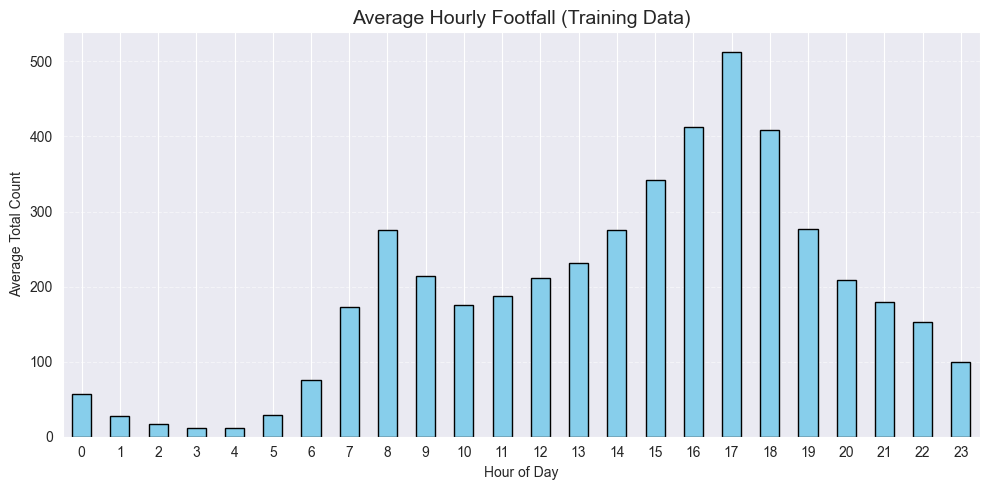

In [20]:
import matplotlib.pyplot as plt

# In the original data, the time variable is 'hour_of_day'
hourly_avg = df.groupby("hour_of_day")["total_count"].mean()

plt.figure(figsize=(10, 5))
hourly_avg.plot(kind="bar", color="skyblue", edgecolor="black")
plt.title("Average Hourly Footfall (Training Data)", fontsize=14)
plt.xlabel("Hour of Day")
plt.ylabel("Average Total Count")
plt.xticks(rotation=0)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

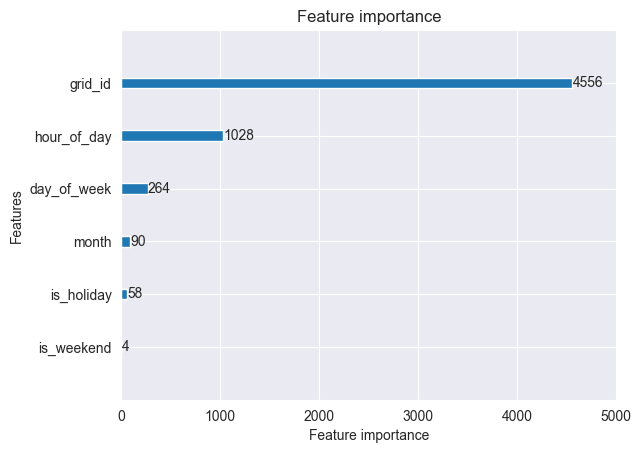

In [61]:
import matplotlib.pyplot as plt
lgb.plot_importance(model, max_num_features=10)
plt.show()

#### Light GBM with zone cluster & pick time & time_bin

In [62]:
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.cluster import KMeans
import numpy as np
import time

# Start timing
start_time = time.time()

# Load data
df = pd.read_csv("merged_hourly_grid_with_features.csv")

# Convert grid_id to category
df["grid_id"] = df["grid_id"].astype("category")

# Zone cluster: Group similar grids using KMeans
# For clustering, grid_id should be mapped to centroids (optional, here we assume grid_id ~ spatial meaning)
df["zone_cluster"] = KMeans(n_clusters=10, random_state=42).fit_predict(df[["grid_id"]])

# Time bin feature
def assign_time_bin(hour):
    if 7 <= hour <= 9:
        return "morning_peak"
    elif 17 <= hour <= 19:
        return "evening_peak"
    elif 0 <= hour <= 5:
        return "late_night"
    else:
        return "off_peak"
df["time_bin"] = df["hour_of_day"].apply(assign_time_bin)

# Peak hour flag
df["is_peak_hour"] = df["hour_of_day"].isin([7,8,9,17,18,19]) & (df["is_weekend"] == False)

# Feature list
features = [
    "grid_id",
    "hour_of_day",
    "day_of_week",
    "month",
    "is_weekend",
    "is_holiday",
    "zone_cluster",      # Feature Engineering
    "time_bin",          # Feature Engineering
    "is_peak_hour"       # Feature Engineering
]
target = "total_count"

# Category casting
df["zone_cluster"] = df["zone_cluster"].astype("category")
df["time_bin"] = df["time_bin"].astype("category")
df["is_peak_hour"] = df["is_peak_hour"].astype("bool")

# Prepare input/output
X = df[features]
y = np.log1p(df[target])  # log transform

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Model init
model = lgb.LGBMRegressor(
    objective="regression",
    n_estimators=200,
    learning_rate=0.1,
    random_state=42
)

# Train model
model.fit(X_train, y_train)

# Predict and evaluate
y_pred_log = model.predict(X_test)
y_pred = np.expm1(y_pred_log)  # inverse log1p

r2 = r2_score(np.expm1(y_test), y_pred)
rae = mean_absolute_error(np.expm1(y_test), y_pred) / (
    abs(np.expm1(y_test) - np.expm1(y_test).mean()).sum() / len(y_test)
)

# Report
end_time = time.time()
elapsed = end_time - start_time

print(f"R² Score: {r2:.4f}")
print(f"RAE (Relative Absolute Error): {rae:.4f}")
print(f"Total runtime: {elapsed:.2f} seconds")


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.072805 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1575
[LightGBM] [Info] Number of data points in the train set: 3130558, number of used features: 9
[LightGBM] [Info] Start training from score 2.487479
R² Score: 0.9222
RAE (Relative Absolute Error): 0.1632
Total runtime: 13.01 seconds


In [63]:
# Overfitting diagnostics
y_pred_train_log = model.predict(X_train)
y_pred_train = np.expm1(y_pred_train_log)

train_r2 = r2_score(np.expm1(y_train), y_pred_train)
train_rae = mean_absolute_error(np.expm1(y_train), y_pred_train) / (
    abs(np.expm1(y_train) - np.expm1(y_train).mean()).sum() / len(y_train)
)

print("\n=== Training Set Performance ===")
print(f"Train R² Score: {train_r2:.4f}")
print(f"Train RAE: {train_rae:.4f}")

print("\n=== Testing Set Performance ===")
print(f"Test R² Score: {r2:.4f}")
print(f"Test RAE: {rae:.4f}")

print("\n=== Overfitting Diagnostics ===")
print(f"R² Gap (Train - Test): {train_r2 - r2:.4f}")
print(f"RAE Gap (Test - Train): {rae - train_rae:.4f}")

if (train_r2 - r2 > 0.02) or (rae - train_rae > 0.02):
    print("Possible overfitting detected.")
else:
    print("No strong signs of overfitting.")



=== Training Set Performance ===
Train R² Score: 0.9229
Train RAE: 0.1626

=== Testing Set Performance ===
Test R² Score: 0.9222
Test RAE: 0.1632

=== Overfitting Diagnostics ===
R² Gap (Train - Test): 0.0006
RAE Gap (Test - Train): 0.0006
No strong signs of overfitting.


##### Check what the R^2 will be after removing feature grid_id

In [64]:
# Remove grid_id and retrain
features_no_grid = [f for f in features if f != "grid_id"]
X_ng = df[features_no_grid]
y_ng = np.log1p(df[target])

X_ng_train, X_ng_test, y_ng_train, y_ng_test = train_test_split(
    X_ng, y_ng, test_size=0.3, random_state=42
)

model_ng = lgb.LGBMRegressor(
    objective="regression",
    n_estimators=200,
    learning_rate=0.1,
    random_state=42
)
model_ng.fit(X_ng_train, y_ng_train)

y_ng_pred_log = model_ng.predict(X_ng_test)
y_ng_pred = np.expm1(y_ng_pred_log)

r2_ng = r2_score(np.expm1(y_ng_test), y_ng_pred)
rae_ng = mean_absolute_error(np.expm1(y_ng_test), y_ng_pred) / (
    abs(np.expm1(y_ng_test) - np.expm1(y_ng_test).mean()).sum() / len(y_ng_test)
)

print(f"\n Test R² (No grid_id): {r2_ng:.4f}")
print(f"Test RAE (No grid_id): {rae_ng:.4f}")

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.068099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 58
[LightGBM] [Info] Number of data points in the train set: 3130558, number of used features: 8
[LightGBM] [Info] Start training from score 2.487479

 Test R² (No grid_id): 0.0863
Test RAE (No grid_id): 0.6667


=== Feature Importances ===
        feature  importance
0       grid_id        3789
1   hour_of_day        1243
2   day_of_week         361
6  zone_cluster         248
3         month         124
7      time_bin          84
5    is_holiday          82
8  is_peak_hour          66
4    is_weekend           3


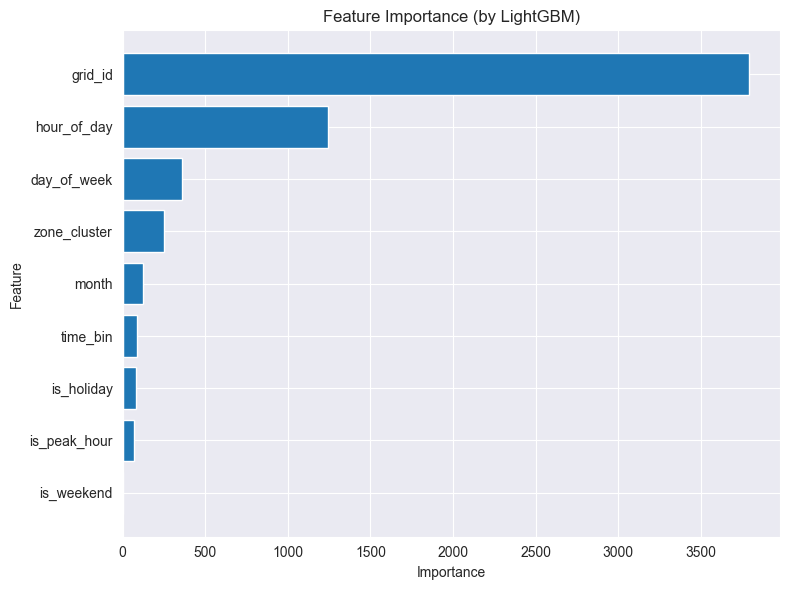

In [66]:
import matplotlib.pyplot as plt

# Get feature importance scores
importance_df = pd.DataFrame({
    "feature": model.feature_name_,
    "importance": model.feature_importances_
}).sort_values(by="importance", ascending=False)

print("=== Feature Importances ===")
print(importance_df)

# Plot importance
plt.figure(figsize=(8, 6))
plt.barh(importance_df["feature"], importance_df["importance"])
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Feature Importance (by LightGBM)")
plt.gca().invert_yaxis()  # Highest importance on top
plt.tight_layout()
plt.show()

#### Light GBM with Weather features

In [68]:
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error
import numpy as np
import time 

# Start timing
start_time = time.time()

# Load data
df = pd.read_csv("merged_hourly_grid_with_features_with_weather.csv")

# Define features and target (convert grid_id to categorical)
df["grid_id"] = df["grid_id"].astype("category")

# + weather features
features = [
    "grid_id", "hour_of_day", "day_of_week", "month",
    "is_weekend", "is_holiday", "temperature", "precipitation"
]
target = "total_count"

X = df[features]
y = np.log1p(df[target])  # log1p ensures stability with small values

# === 3. Split into training and test sets (random, time-independent) ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Initialize LightGBM model
model = lgb.LGBMRegressor(
    objective="regression",
    n_estimators=200,
    learning_rate=0.1,
    random_state=42
)

# Train the model
model.fit(X_train, y_train)

# Predict and evaluate
y_pred_log = model.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Undo log1p

# Evaluate
r2 = r2_score(np.expm1(y_test), y_pred)
rae = mean_absolute_error(np.expm1(y_test), y_pred) / (
    abs(np.expm1(y_test) - np.expm1(y_test).mean()).sum() / len(y_test)
)

# End timing and report
end_time = time.time()
elapsed = end_time - start_time

print(f"R² Score: {r2:.4f}")
print(f"RAE (Relative Absolute Error): {rae:.4f}")
print(f"Total runtime: {elapsed:.2f} seconds")


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1910
[LightGBM] [Info] Number of data points in the train set: 3130558, number of used features: 8
[LightGBM] [Info] Start training from score 2.487479
R² Score: 0.9083
RAE (Relative Absolute Error): 0.1723
Total runtime: 9.50 seconds


In [69]:
# Detect Overfitting
y_train_pred_log = model.predict(X_train)
y_train_pred = np.expm1(y_train_pred_log)

train_r2 = r2_score(np.expm1(y_train), y_train_pred)
train_rae = mean_absolute_error(np.expm1(y_train), y_train_pred) / (
    abs(np.expm1(y_train) - np.expm1(y_train).mean()).sum() / len(y_train)
)

r2_gap = train_r2 - r2
rae_gap = rae - train_rae

print("\n=== Training Set Performance ===")
print(f"Train R² Score: {train_r2:.4f}")
print(f"Train RAE: {train_rae:.4f}")

print("\n=== Testing Set Performance ===")
print(f"Test R² Score: {r2:.4f}")
print(f"Test RAE: {rae:.4f}")

print("\n=== Overfitting Diagnostics ===")
print(f"R² Gap (Train - Test): {r2_gap:.4f}")
print(f"RAE Gap (Test - Train): {rae_gap:.4f}")

if r2_gap > 0.05 or rae_gap > 0.05:
    print("!!!!!Potential Overfitting Detected!")
else:
    print("No strong signs of overfitting.")



=== Training Set Performance ===
Train R² Score: 0.9085
Train RAE: 0.1716

=== Testing Set Performance ===
Test R² Score: 0.9083
Test RAE: 0.1723

=== Overfitting Diagnostics ===
R² Gap (Train - Test): 0.0002
RAE Gap (Test - Train): 0.0007
No strong signs of overfitting.


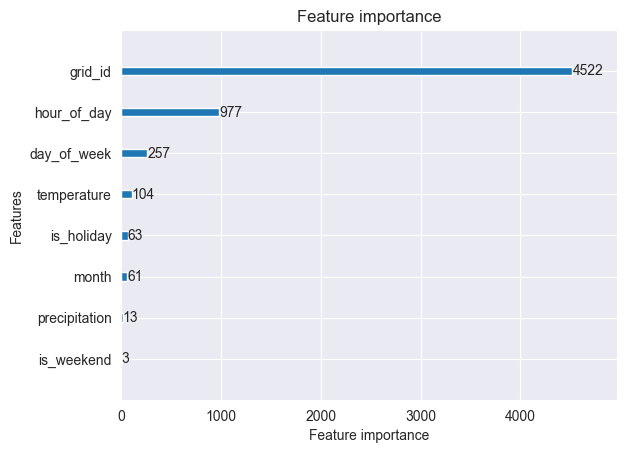

In [70]:
import matplotlib.pyplot as plt
lgb.plot_importance(model, max_num_features=10)
plt.show()


#### Light GBM with Weather + Time cluster + time_bin + pick hour

In [71]:
# import pandas as pd
# import lightgbm as lgb
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import r2_score, mean_absolute_error
# from sklearn.cluster import KMeans
# import numpy as np
# import time
# 
# # Load data
# df = pd.read_csv("merged_hourly_grid_with_features_with_weather.csv")
# 
# # Add spatial clustering
# if "grid_lat" not in df.columns or "grid_lon" not in df.columns:
#     centroids = pd.read_csv("grid_id_centroids.csv")
#     centroids.rename(columns={"latitude": "grid_lat", "longitude": "grid_lon"}, inplace=True)
#     df = df.merge(centroids, on="grid_id", how="left")
# 
# # Run KMeans on spatial coordinates
# kmeans = KMeans(n_clusters=10, random_state=42)
# df["zone_cluster"] = kmeans.fit_predict(df[["grid_lat", "grid_lon"]])
# df["zone_cluster"] = df["zone_cluster"].astype("category")
# 
# # Prepare features and target
# df["grid_id"] = df["grid_id"].astype("category")
# 
# features = [
#     "grid_id", "hour_of_day", "day_of_week", "month",
#     "is_weekend", "is_holiday", "temperature", "precipitation", "zone_cluster"
# ]
# target = "total_count"
# 
# X = df[features]
# y = np.log1p(df[target]) 
# 
# # Split data
# X_train, X_test, y_train, y_test = train_test_split(
#     X, y, test_size=0.3, random_state=42
# )
# 
# # Train LightGBM model
# model = lgb.LGBMRegressor(
#     objective="regression",
#     n_estimators=200,
#     learning_rate=0.1,
#     random_state=42
# )
# model.fit(X_train, y_train)
# 
# # Predict and Evaluate
# y_pred_log = model.predict(X_test)
# y_pred = np.expm1(y_pred_log)
# 
# r2 = r2_score(np.expm1(y_test), y_pred)
# rae = mean_absolute_error(np.expm1(y_test), y_pred) / (
#     abs(np.expm1(y_test) - np.expm1(y_test).mean()).sum() / len(y_test)
# )
# 
# # Print Results
# print(f"R² Score: {r2:.4f}")
# print(f"RAE (Relative Absolute Error): {rae:.4f}")


ValueError: Input X contains NaN.
KMeans does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

#### Saved as .pkl file

In [ ]:
# import joblib
# 
# # save the model as pkl file LightGBM_predictor.pkl
# joblib.dump(model, "gridV1.pkl")
# 
# print("Model has been saved as gridV1.pkl")

### RF model (basic features)

In [4]:
import pandas as pd
import numpy as np
import time
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error

# Start timing
start_time = time.time()

# Load data
df = pd.read_csv("merged_hourly_grid_with_features.csv")

# Define features and target (convert grid_id to categorical)
df["grid_id"] = df["grid_id"].astype("category")
features = ["grid_id", "hour_of_day", "day_of_week", "month", "is_weekend", "is_holiday"]
target = "total_count"

X = df[features]
y = np.log1p(df[target])

# Split into training and test sets (random, time-independent)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Initialize Random Forest model
model = RandomForestRegressor(
    n_estimators=100,
    random_state=42,
    n_jobs=-1
)

# Train the model
model.fit(X_train, y_train)

# Predict and evaluate
y_pred_log = model.predict(X_test)
y_pred = np.expm1(y_pred_log)

r2 = r2_score(np.expm1(y_test), y_pred)
rae = mean_absolute_error(np.expm1(y_test), y_pred) / (
    abs(np.expm1(y_test) - np.expm1(y_test).mean()).sum() / len(y_test)
)

# End timing and report
end_time = time.time()
elapsed = end_time - start_time

print(f"R² Score (Random Forest): {r2:.4f}")
print(f"RAE (Relative Absolute Error): {rae:.4f}")
print(f"Total runtime (Random Forest): {elapsed:.2f} seconds")


R² Score (Random Forest): 0.9783
RAE (Relative Absolute Error): 0.0894
Total runtime (Random Forest): 83.10 seconds


Feature Importance (Random Forest):
       Feature  Importance
0      grid_id    0.734228
1  hour_of_day    0.234645
2  day_of_week    0.012910
4   is_weekend    0.008084
3        month    0.007597
5   is_holiday    0.002535


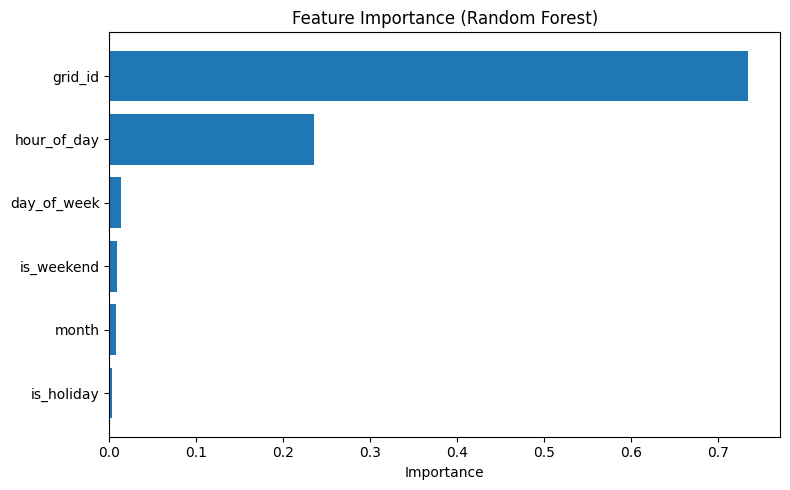

In [5]:
# Print feature importance 
import matplotlib.pyplot as plt

# Create a DataFrame to hold feature names and their importance scores
importance_df = pd.DataFrame({
    "Feature": X_train.columns,
    "Importance": model.feature_importances_
}).sort_values(by="Importance", ascending=False)

# Print in table format
print("Feature Importance (Random Forest):")
print(importance_df)

# Optional: Visualize with a bar chart
plt.figure(figsize=(8, 5))
plt.barh(importance_df["Feature"], importance_df["Importance"])
plt.gca().invert_yaxis()
plt.xlabel("Importance")
plt.title("Feature Importance (Random Forest)")
plt.tight_layout()


plt.show()


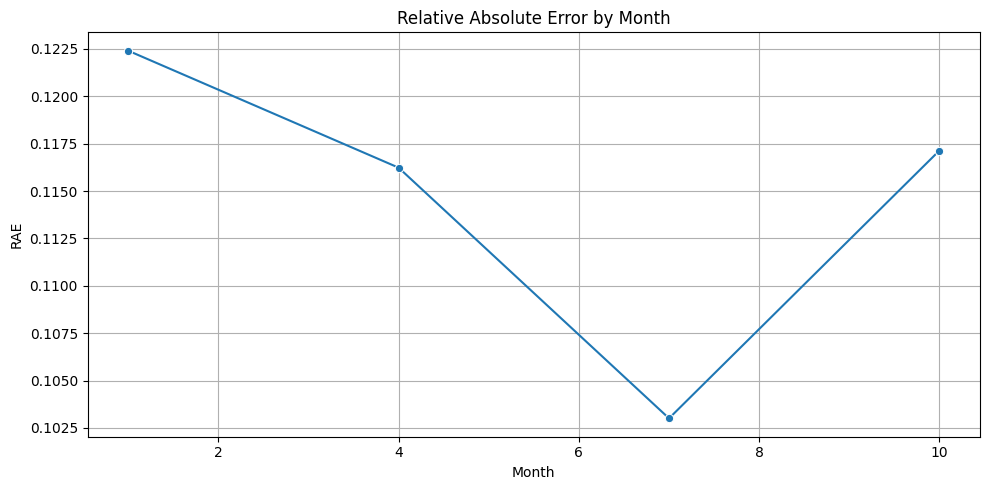

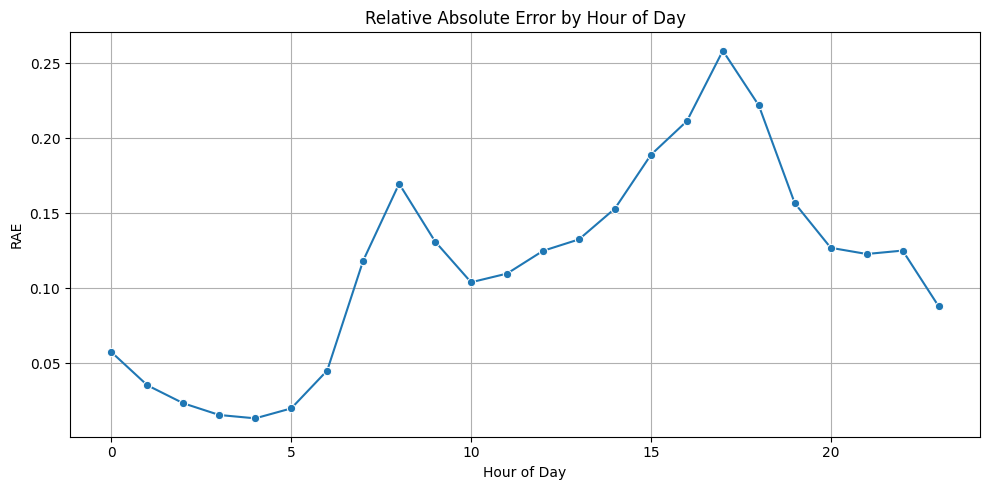

Best-performing month (lowest RAE): Month 7 with RAE = 0.1030
Worst-performing month: Month 1 with RAE = 0.1224
Best-performing hour: 4:00 with RAE = 0.0135
Worst-performing hour: 17:00 with RAE = 0.2582


In [7]:
# Evaluate model performance by season (month) and hour_of_day
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare test set with predictions and metadata
test_result = X_test.copy()
test_result["y_true"] = np.expm1(y_test)
test_result["y_pred"] = y_pred
test_result["abs_error"] = abs(test_result["y_pred"] - test_result["y_true"])

# === Insight 1: By Month (Seasonal performance) ===
monthly_error = test_result.groupby("month").agg({
    "y_true": "mean",
    "y_pred": "mean",
    "abs_error": "mean"
}).reset_index()
monthly_error["RAE"] = monthly_error["abs_error"] / (monthly_error["y_true"].mean())

plt.figure(figsize=(10, 5))
sns.lineplot(data=monthly_error, x="month", y="RAE", marker="o")
plt.title("Relative Absolute Error by Month")
plt.xlabel("Month")
plt.ylabel("RAE")
plt.grid(True)
plt.tight_layout()
plt.savefig("rae_by_month.jpg", dpi=300)
plt.show()

# === Insight 2: By Hour of Day ===
hourly_error = test_result.groupby("hour_of_day").agg({
    "y_true": "mean",
    "y_pred": "mean",
    "abs_error": "mean"
}).reset_index()
hourly_error["RAE"] = hourly_error["abs_error"] / (hourly_error["y_true"].mean())

plt.figure(figsize=(10, 5))
sns.lineplot(data=hourly_error, x="hour_of_day", y="RAE", marker="o")
plt.title("Relative Absolute Error by Hour of Day")
plt.xlabel("Hour of Day")
plt.ylabel("RAE")
plt.grid(True)
plt.tight_layout()
plt.savefig("rae_by_hour.jpg", dpi=300)
plt.show()

# Optional: print best/worst performing time blocks
best_month = monthly_error.sort_values("RAE").iloc[0]
worst_month = monthly_error.sort_values("RAE").iloc[-1]
best_hour = hourly_error.sort_values("RAE").iloc[0]
worst_hour = hourly_error.sort_values("RAE").iloc[-1]

print(f"Best-performing month (lowest RAE): Month {int(best_month['month'])} with RAE = {best_month['RAE']:.4f}")
print(f"Worst-performing month: Month {int(worst_month['month'])} with RAE = {worst_month['RAE']:.4f}")
print(f"Best-performing hour: {int(best_hour['hour_of_day'])}:00 with RAE = {best_hour['RAE']:.4f}")
print(f"Worst-performing hour: {int(worst_hour['hour_of_day'])}:00 with RAE = {worst_hour['RAE']:.4f}")


In [ ]:
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

# Restore original target values
y_test_actual = np.expm1(y_test)
y_pred_actual = y_pred.copy()

# Add month and hour info back to test set
test_info = X_test.copy()
test_info["actual"] = y_test_actual
test_info["predicted"] = y_pred_actual

# --------------------------
# Insight 1: R² by Month
# --------------------------
r2_by_month = test_info.groupby("month").apply(
    lambda group: r2_score(group["actual"], group["predicted"])
).reset_index(name="R²")

print("R² Score by Month:")
print(r2_by_month)

# Plot R² by month
plt.figure(figsize=(7, 4))
plt.bar(r2_by_month["month"], r2_by_month["R²"])
plt.xticks(r2_by_month["month"])
plt.xlabel("Month")
plt.ylabel("R² Score")
plt.title("Prediction Accuracy by Month")
plt.tight_layout()
plt.show()

# --------------------------
# Insight 2: R² by Hour of Day
# --------------------------
r2_by_hour = test_info.groupby("hour_of_day").apply(
    lambda group: r2_score(group["actual"], group["predicted"])
).reset_index(name="R²")

print("\nR² Score by Hour of Day:")
print(r2_by_hour)

# Plot R² by hour
plt.figure(figsize=(7, 4))
plt.bar(r2_by_hour["hour_of_day"], r2_by_hour["R²"])
plt.xticks(r2_by_hour["hour_of_day"])
plt.xlabel("Hour of Day")
plt.ylabel("R² Score")
plt.title("Prediction Accuracy by Hour of Day")
plt.tight_layout()
plt.show()


### Save as joblib file

In [74]:
import joblib

joblib.dump(model, "random_forest_model_final.joblib")
print("Model saved to random_forest_model_final.joblib")


Model saved to random_forest_model_final.joblib


In [75]:
# Detect Overfitting
y_train_pred_log = model.predict(X_train)
y_train_pred = np.expm1(y_train_pred_log)

train_r2 = r2_score(np.expm1(y_train), y_train_pred)
train_rae = mean_absolute_error(np.expm1(y_train), y_train_pred) / (
    abs(np.expm1(y_train) - np.expm1(y_train).mean()).sum() / len(y_train)
)

r2_gap = train_r2 - r2
rae_gap = rae - train_rae

print("\n=== Training Set Performance ===")
print(f"Train R² Score: {train_r2:.4f}")
print(f"Train RAE: {train_rae:.4f}")

print("\n=== Testing Set Performance ===")
print(f"Test R² Score: {r2:.4f}")
print(f"Test RAE: {rae:.4f}")

print("\n=== Overfitting Diagnostics ===")
print(f"R² Gap (Train - Test): {r2_gap:.4f}")
print(f"RAE Gap (Test - Train): {rae_gap:.4f}")

if r2_gap > 0.05 or rae_gap > 0.05:
    print("!!!!!Potential Overfitting Detected!")
else:
    print("No strong signs of overfitting.")



=== Training Set Performance ===
Train R² Score: 0.9896
Train RAE: 0.0614

=== Testing Set Performance ===
Test R² Score: 0.9783
Test RAE: 0.0894

=== Overfitting Diagnostics ===
R² Gap (Train - Test): 0.0114
RAE Gap (Test - Train): 0.0280
No strong signs of overfitting.


### RF with weather features

In [1]:
import pandas as pd
import numpy as np
import time
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error

# Start timing
start_time = time.time()

# Load data
df = pd.read_csv("merged_hourly_grid_with_features_with_weather.csv")

# Preprocessing
df["grid_id"] = df["grid_id"].astype("category")
features = [
    "grid_id", "hour_of_day", "day_of_week", "month",
    "is_weekend", "is_holiday", "temperature", "precipitation"
]
target = "total_count"

X = df[features]
y = np.log1p(df[target])  # log1p for stability

# Random train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Train Random Forest
model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
model.fit(X_train, y_train)

# Predict & evaluate
y_pred_log = model.predict(X_test)
y_pred = np.expm1(y_pred_log)

r2 = r2_score(np.expm1(y_test), y_pred)
rae = mean_absolute_error(np.expm1(y_test), y_pred) / (
    abs(np.expm1(y_test) - np.expm1(y_test).mean()).sum() / len(y_test)
)

# Overfitting check
y_train_pred = np.expm1(model.predict(X_train))
train_r2 = r2_score(np.expm1(y_train), y_train_pred)
train_rae = mean_absolute_error(np.expm1(y_train), y_train_pred) / (
    abs(np.expm1(y_train) - np.expm1(y_train).mean()).sum() / len(y_train)
)

# Feature importance
feature_importance = pd.DataFrame({
    "feature": X.columns,
    "importance": model.feature_importances_
}).sort_values(by="importance", ascending=False)

# Time-based split
df_sorted = df.sort_values(by=["month", "day_of_week", "hour_of_day"])
X_sorted = df_sorted[features]
y_sorted = np.log1p(df_sorted[target])

split_index = int(0.7 * len(df_sorted))
X_train_time = X_sorted.iloc[:split_index]
X_test_time = X_sorted.iloc[split_index:]
y_train_time = y_sorted.iloc[:split_index]
y_test_time = y_sorted.iloc[split_index:]

model_time = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
model_time.fit(X_train_time, y_train_time)

y_pred_time = np.expm1(model_time.predict(X_test_time))
r2_time = r2_score(np.expm1(y_test_time), y_pred_time)
rae_time = mean_absolute_error(np.expm1(y_test_time), y_pred_time) / (
    abs(np.expm1(y_test_time) - np.expm1(y_test_time).mean()).sum() / len(y_test_time)
)

# Without grid_id
features_no_grid = [f for f in features if f != "grid_id"]
X_ng = df[features_no_grid]
y_ng = np.log1p(df[target])
X_train_ng, X_test_ng, y_train_ng, y_test_ng = train_test_split(
    X_ng, y_ng, test_size=0.3, random_state=42
)

model_ng = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
model_ng.fit(X_train_ng, y_train_ng)
y_pred_ng = np.expm1(model_ng.predict(X_test_ng))
r2_ng = r2_score(np.expm1(y_test_ng), y_pred_ng)
rae_ng = mean_absolute_error(np.expm1(y_test_ng), y_pred_ng) / (
    abs(np.expm1(y_test_ng) - np.expm1(y_test_ng).mean()).sum() / len(y_test_ng)
)

# Print Results
print(f"\n R² Score (Random): {r2:.4f}")
print(f" RAE: {rae:.4f}")
print(f"\n=== Training Set Performance ===")
print(f"Train R² Score: {train_r2:.4f}")
print(f"Train RAE: {train_rae:.4f}")
print(f"\n=== Overfitting Diagnostics ===")
print(f"R² Gap (Train - Test): {train_r2 - r2:.4f}")
print(f"RAE Gap (Test - Train): {rae - train_rae:.4f}")
print(" No strong signs of overfitting." if (train_r2 - r2 <= 0.05 and rae - train_rae <= 0.05) else "⚠️ Potential Overfitting")

print(f"\n=== Feature Importances ===")
print(feature_importance)

print(f"\n Test R² (Time-split): {r2_time:.4f}")
print(f" Test RAE (Time-split): {rae_time:.4f}")

print(f"\n Test R² (No grid_id): {r2_ng:.4f}")
print(f" Test RAE (No grid_id): {rae_ng:.4f}")

# === Runtime ===
print(f"\n Total runtime: {time.time() - start_time:.2f} seconds")



 R² Score (Random): 0.9822
 RAE: 0.0798

=== Training Set Performance ===
Train R² Score: 0.9972
Train RAE: 0.0300

=== Overfitting Diagnostics ===
R² Gap (Train - Test): 0.0151
RAE Gap (Test - Train): 0.0497
 No strong signs of overfitting.

=== Feature Importances ===
         feature  importance
0        grid_id    0.728003
1    hour_of_day    0.232435
2    day_of_week    0.012308
6    temperature    0.012132
4     is_weekend    0.007924
3          month    0.003447
5     is_holiday    0.002432
7  precipitation    0.001319

 Test R² (Time-split): 0.9529
 Test RAE (Time-split): 0.1427

 Test R² (No grid_id): 0.0165
 Test RAE (No grid_id): 0.6983

 Total runtime: 311.64 seconds


#### RF with zone cluster + time_bin + is_peak

In [3]:
import pandas as pd
import numpy as np
import time
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder 

# Start timing
start_time = time.time()

# Load data
df = pd.read_csv("merged_hourly_grid_with_features.csv")

# Feature engineering
df["grid_id"] = df["grid_id"].astype("category")

# zone_cluster
df["zone_cluster"] = KMeans(n_clusters=10, random_state=42).fit_predict(df[["grid_id"]])

# time_bin
def assign_time_bin(hour):
    if 7 <= hour <= 9:
        return "morning_peak"
    elif 17 <= hour <= 19:
        return "evening_peak"
    elif 0 <= hour <= 5:
        return "late_night"
    else:
        return "off_peak"
df["time_bin"] = df["hour_of_day"].apply(assign_time_bin)

# is_peak_hour
df["is_peak_hour"] = df["hour_of_day"].isin([7, 8, 9, 17, 18, 19]) & (df["is_weekend"] == False)
df["is_peak_hour"] = df["is_peak_hour"].astype(bool)

# Label encode-grid_id, zone_cluster, time_bin
for col in ["grid_id", "zone_cluster", "time_bin"]:
    if df[col].dtype.name in ["category", "object"]:
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col])

# Define features and target
features = [
    "grid_id",
    "hour_of_day",
    "day_of_week",
    "month",
    "is_weekend",
    "is_holiday",
    "zone_cluster",   
    "time_bin",       
    "is_peak_hour"    
]
target = "total_count"

X = df[features]
y = np.log1p(df[target])  # log-transform target

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Initialize Random Forest model
model = RandomForestRegressor(
    n_estimators=100,
    random_state=42,
    n_jobs=-1
)

# Train the model
model.fit(X_train, y_train)

# Predict and evaluate
y_pred_log = model.predict(X_test)
y_pred = np.expm1(y_pred_log)

r2 = r2_score(np.expm1(y_test), y_pred)
rae = mean_absolute_error(np.expm1(y_test), y_pred) / (
    abs(np.expm1(y_test) - np.expm1(y_test).mean()).sum() / len(y_test)
)

# Report
end_time = time.time()
elapsed = end_time - start_time

print(f" R² Score (Random Forest): {r2:.4f}")
print(f" RAE (Relative Absolute Error): {rae:.4f}")
print(f" Total runtime (Random Forest): {elapsed:.2f} seconds")


 R² Score (Random Forest): 0.9782
 RAE (Relative Absolute Error): 0.0895
 Total runtime (Random Forest): 113.84 seconds


### XGBoost - Basic features

In [3]:
import pandas as pd
import numpy as np
import time
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error

# Start timing
start_time = time.time()

# Load data
df = pd.read_csv("merged_hourly_grid_with_features.csv")

# Preprocessing
df["grid_id"] = df["grid_id"].astype("category").cat.codes  # Convert category to int
df["is_weekend"] = df["is_weekend"].astype(int)
df["is_holiday"] = df["is_holiday"].astype(int)

features = ["grid_id", "hour_of_day", "day_of_week", "month", "is_weekend", "is_holiday"]
target = "total_count"

X = df[features]
y = np.log1p(df[target])  # log1p for stability

# Random train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Train XGBoost Model
model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)
model.fit(X_train, y_train)

# Predict & evaluate
y_pred_log = model.predict(X_test)
y_pred = np.expm1(y_pred_log)

r2 = r2_score(np.expm1(y_test), y_pred)
rae = mean_absolute_error(np.expm1(y_test), y_pred) / (
    abs(np.expm1(y_test) - np.expm1(y_test).mean()).sum() / len(y_test)
)

# Overfitting check
y_train_pred = np.expm1(model.predict(X_train))
train_r2 = r2_score(np.expm1(y_train), y_train_pred)
train_rae = mean_absolute_error(np.expm1(y_train), y_train_pred) / (
    abs(np.expm1(y_train) - np.expm1(y_train).mean()).sum() / len(y_train)
)

# Feature importance
feature_importance = pd.DataFrame({
    "feature": X.columns,
    "importance": model.feature_importances_
}).sort_values(by="importance", ascending=False)

# Time-based split
df_sorted = df.sort_values(by=["month", "day_of_week", "hour_of_day"])
X_sorted = df_sorted[features]
y_sorted = np.log1p(df_sorted[target])

split_index = int(0.7 * len(df_sorted))
X_train_time = X_sorted.iloc[:split_index]
X_test_time = X_sorted.iloc[split_index:]
y_train_time = y_sorted.iloc[:split_index]
y_test_time = y_sorted.iloc[split_index:]

model_time = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)
model_time.fit(X_train_time, y_train_time)

y_pred_time = np.expm1(model_time.predict(X_test_time))
r2_time = r2_score(np.expm1(y_test_time), y_pred_time)
rae_time = mean_absolute_error(np.expm1(y_test_time), y_pred_time) / (
    abs(np.expm1(y_test_time) - np.expm1(y_test_time).mean()).sum() / len(y_test_time)
)

# Without grid_id
features_no_grid = [f for f in features if f != "grid_id"]
X_ng = df[features_no_grid]
y_ng = np.log1p(df[target])

X_train_ng, X_test_ng, y_train_ng, y_test_ng = train_test_split(
    X_ng, y_ng, test_size=0.3, random_state=42
)

model_ng = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)
model_ng.fit(X_train_ng, y_train_ng)
y_pred_ng = np.expm1(model_ng.predict(X_test_ng))
r2_ng = r2_score(np.expm1(y_test_ng), y_pred_ng)
rae_ng = mean_absolute_error(np.expm1(y_test_ng), y_pred_ng) / (
    abs(np.expm1(y_test_ng) - np.expm1(y_test_ng).mean()).sum() / len(y_test_ng)
)

# Print Results
print(f"\nR² Score (XGBoost): {r2:.4f}")
print(f"RAE: {rae:.4f}")
print(f"\n=== Training Set Performance ===")
print(f"Train R² Score: {train_r2:.4f}")
print(f"Train RAE: {train_rae:.4f}")
print(f"\n=== Overfitting Diagnostics ===")
print(f"R² Gap (Train - Test): {train_r2 - r2:.4f}")
print(f"RAE Gap (Test - Train): {rae - train_rae:.4f}")
print("No strong signs of overfitting." if (train_r2 - r2 <= 0.05 and rae - train_rae <= 0.05) else "⚠️ Potential Overfitting")

print(f"\n=== Feature Importances ===")
print(feature_importance)

print(f"\n Test R² (Time-split): {r2_time:.4f}")
print(f" Test RAE (Time-split): {rae_time:.4f}")

print(f"\n Test R² (No grid_id): {r2_ng:.4f}")
print(f" Test RAE (No grid_id): {rae_ng:.4f}")

# Runtime
print(f"\n Total runtime: {time.time() - start_time:.2f} seconds")



R² Score (XGBoost): 0.2458
RAE: 0.5756

=== Training Set Performance ===
Train R² Score: 0.2473
Train RAE: 0.5748

=== Overfitting Diagnostics ===
R² Gap (Train - Test): 0.0015
RAE Gap (Test - Train): 0.0008
No strong signs of overfitting.

=== Feature Importances ===
       feature  importance
0      grid_id    0.461954
1  hour_of_day    0.387154
2  day_of_week    0.076393
5   is_holiday    0.052605
3        month    0.021894
4   is_weekend    0.000000

 Test R² (Time-split): 0.2124
 Test RAE (Time-split): 0.5936

 Test R² (No grid_id): -0.0544
 Test RAE (No grid_id): 0.7236

 Total runtime: 13.22 seconds


The XGBoost model performed poorly, with an R² of only 0.2458 and a relatively high RAE of 0.5756.
This is likely because grid_id, a key spatial feature, was not one-hot encoded in this setup.

Unlike tree-based models such as Random Forest (which can somewhat tolerate label-encoded categorical variables), XGBoost is highly sensitive to improperly encoded categorical features.
When categorical values like grid_id are treated as ordered integers, XGBoost may misinterpret their meaning, leading to poor split decisions and degraded performance.

Next, we will apply one-hot encoding to grid_id to evaluate whether it significantly improves model performance.

#### Apply one-hot encoding to grid_id to represent it as binary features

In [1]:
import pandas as pd
import numpy as np
import time
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error

# Start timing
start_time = time.time()

# Load data
df = pd.read_csv("merged_hourly_grid_with_features.csv")

# Preprocessing
df = pd.get_dummies(df, columns=["grid_id"], drop_first=True)  # One-hot encode grid_id
df["is_weekend"] = df["is_weekend"].astype(int)
df["is_holiday"] = df["is_holiday"].astype(int)

# Feature columns
grid_id_columns = [col for col in df.columns if col.startswith("grid_id_")]
features = grid_id_columns + ["hour_of_day", "day_of_week", "month", "is_weekend", "is_holiday"]
target = "total_count"

X = df[features]
y = np.log1p(df[target])  # log1p for stability

# Random train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Train XGBoost Model
model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)
model.fit(X_train, y_train)

# Predict & evaluate
y_pred_log = model.predict(X_test)
y_pred = np.expm1(y_pred_log)

r2 = r2_score(np.expm1(y_test), y_pred)
rae = mean_absolute_error(np.expm1(y_test), y_pred) / (
    abs(np.expm1(y_test) - np.expm1(y_test).mean()).sum() / len(y_test)
)

# Overfitting check
y_train_pred = np.expm1(model.predict(X_train))
train_r2 = r2_score(np.expm1(y_train), y_train_pred)
train_rae = mean_absolute_error(np.expm1(y_train), y_train_pred) / (
    abs(np.expm1(y_train) - np.expm1(y_train).mean()).sum() / len(y_train)
)

# Feature importance
feature_importance = pd.DataFrame({
    "feature": X.columns,
    "importance": model.feature_importances_
}).sort_values(by="importance", ascending=False)

# Time-based split
df_sorted = df.sort_values(by=["month", "day_of_week", "hour_of_day"])
X_sorted = df_sorted[features]
y_sorted = np.log1p(df_sorted[target])

split_index = int(0.7 * len(df_sorted))
X_train_time = X_sorted.iloc[:split_index]
X_test_time = X_sorted.iloc[split_index:]
y_train_time = y_sorted.iloc[:split_index]
y_test_time = y_sorted.iloc[split_index:]

model_time = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)
model_time.fit(X_train_time, y_train_time)

y_pred_time = np.expm1(model_time.predict(X_test_time))
r2_time = r2_score(np.expm1(y_test_time), y_pred_time)
rae_time = mean_absolute_error(np.expm1(y_test_time), y_pred_time) / (
    abs(np.expm1(y_test_time) - np.expm1(y_test_time).mean()).sum() / len(y_test_time)
)

# Without grid_id (i.e., drop all grid_id_* columns)
features_no_grid = [f for f in features if not f.startswith("grid_id_")]
X_ng = df[features_no_grid]
y_ng = np.log1p(df[target])

X_train_ng, X_test_ng, y_train_ng, y_test_ng = train_test_split(
    X_ng, y_ng, test_size=0.3, random_state=42
)

model_ng = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)
model_ng.fit(X_train_ng, y_train_ng)
y_pred_ng = np.expm1(model_ng.predict(X_test_ng))
r2_ng = r2_score(np.expm1(y_test_ng), y_pred_ng)
rae_ng = mean_absolute_error(np.expm1(y_test_ng), y_pred_ng) / (
    abs(np.expm1(y_test_ng) - np.expm1(y_test_ng).mean()).sum() / len(y_test_ng)
)

# Print Results
print(f"\nR² Score (XGBoost): {r2:.4f}")
print(f"RAE: {rae:.4f}")
print(f"\n=== Training Set Performance ===")
print(f"Train R² Score: {train_r2:.4f}")
print(f"Train RAE: {train_rae:.4f}")
print(f"\n=== Overfitting Diagnostics ===")
print(f"R² Gap (Train - Test): {train_r2 - r2:.4f}")
print(f"RAE Gap (Test - Train): {rae - train_rae:.4f}")
print("No strong signs of overfitting." if (train_r2 - r2 <= 0.05 and rae - train_rae <= 0.05) else "⚠️ Potential Overfitting")

print(f"\n=== Feature Importances ===")
print(feature_importance)

print(f"\n Test R² (Time-split): {r2_time:.4f}")
print(f" Test RAE (Time-split): {rae_time:.4f}")

print(f"\n Test R² (No grid_id): {r2_ng:.4f}")
print(f" Test RAE (No grid_id): {rae_ng:.4f}")

# Runtime
print(f"\n Total runtime: {time.time() - start_time:.2f} seconds")


XGBoostError: [17:23:19] C:\actions-runner\_work\xgboost\xgboost\src\common\io.h:389: bad_malloc: Failed to allocate 4905584386 bytes.

In an attempt to improve XGBoost performance, we applied one-hot encoding to the grid_id feature.
However, grid_id contains over 1,500 unique values, which led to the creation of more than 1,499 new binary columns after encoding.

This drastically increased the feature dimensionality, and when training the XGBoost model, the system ran out of memory (OOM), causing the training process to crash.

As a result, we were unable to train or evaluate the XGBoost model under the one-hot encoding setting.
This highlights a key limitation of XGBoost: while it benefits from properly encoded categorical variables, it can struggle with high-cardinality features unless sparse or memory-efficient encoding techniques are used.

#### XGBoost + Feature Engineering

In [9]:
import pandas as pd
import numpy as np
import time
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.cluster import KMeans

# Start timing
start_time = time.time()

# Load data
df = pd.read_csv("merged_hourly_grid_with_features.csv")

# Feature Engineering
df["grid_id"] = df["grid_id"].astype("category").cat.codes
df["is_weekend"] = df["is_weekend"].astype(int)
df["is_holiday"] = df["is_holiday"].astype(int)

# Zone clustering
df["zone_cluster"] = KMeans(n_clusters=10, random_state=42).fit_predict(df[["grid_id"]])

# Time bin classification
def assign_time_bin(hour):
    if 7 <= hour <= 9:
        return "morning_peak"
    elif 17 <= hour <= 19:
        return "evening_peak"
    elif 0 <= hour <= 5:
        return "late_night"
    else:
        return "off_peak"
df["time_bin"] = df["hour_of_day"].apply(assign_time_bin)

# Peak hour flag
df["is_peak_hour"] = df["hour_of_day"].isin([7,8,9,17,18,19]) & (df["is_weekend"] == 0)

# Encode as numeric for XGBoost
df["zone_cluster"] = df["zone_cluster"].astype("category").cat.codes
df["time_bin"] = df["time_bin"].astype("category").cat.codes
df["is_peak_hour"] = df["is_peak_hour"].astype(int)

# Feature list and target
features = [
    "grid_id", "hour_of_day", "day_of_week", "month", 
    "is_weekend", "is_holiday", 
    "zone_cluster", "time_bin", "is_peak_hour"
]
target = "total_count"

X = df[features]
y = np.log1p(df[target])

# Random split training
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Train model
model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)
model.fit(X_train, y_train)

# Evaluation
y_pred_log = model.predict(X_test)
y_pred = np.expm1(y_pred_log)
r2 = r2_score(np.expm1(y_test), y_pred)
rae = mean_absolute_error(np.expm1(y_test), y_pred) / (
    abs(np.expm1(y_test) - np.expm1(y_test).mean()).sum() / len(y_test)
)

# Overfitting check
y_train_pred = np.expm1(model.predict(X_train))
train_r2 = r2_score(np.expm1(y_train), y_train_pred)
train_rae = mean_absolute_error(np.expm1(y_train), y_train_pred) / (
    abs(np.expm1(y_train) - np.expm1(y_train).mean()).sum() / len(y_train)
)

# Feature importance
feature_importance = pd.DataFrame({
    "feature": X.columns,
    "importance": model.feature_importances_
}).sort_values(by="importance", ascending=False)

# Time-based split
df_sorted = df.sort_values(by=["month", "day_of_week", "hour_of_day"])
X_sorted = df_sorted[features]
y_sorted = np.log1p(df_sorted[target])
split_index = int(0.7 * len(df_sorted))
X_train_time = X_sorted.iloc[:split_index]
X_test_time = X_sorted.iloc[split_index:]
y_train_time = y_sorted.iloc[:split_index]
y_test_time = y_sorted.iloc[split_index:]
model_time = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)
model_time.fit(X_train_time, y_train_time)
y_pred_time = np.expm1(model_time.predict(X_test_time))
r2_time = r2_score(np.expm1(y_test_time), y_pred_time)
rae_time = mean_absolute_error(np.expm1(y_test_time), y_pred_time) / (
    abs(np.expm1(y_test_time) - np.expm1(y_test_time).mean()).sum() / len(y_test_time)
)

# Without grid_id
features_no_grid = [f for f in features if f != "grid_id"]
X_ng = df[features_no_grid]
y_ng = np.log1p(df[target])
X_train_ng, X_test_ng, y_train_ng, y_test_ng = train_test_split(
    X_ng, y_ng, test_size=0.3, random_state=42
)
model_ng = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)
model_ng.fit(X_train_ng, y_train_ng)
y_pred_ng = np.expm1(model_ng.predict(X_test_ng))
r2_ng = r2_score(np.expm1(y_test_ng), y_pred_ng)
rae_ng = mean_absolute_error(np.expm1(y_test_ng), y_pred_ng) / (
    abs(np.expm1(y_test_ng) - np.expm1(y_test_ng).mean()).sum() / len(y_test_ng)
)

# Output results
print(f"\n R² Score (XGBoost+Feature Engineering): {r2:.4f}")
print(f" RAE: {rae:.4f}")
print(f"\n=== Training Set Performance ===")
print(f"Train R² Score: {train_r2:.4f}")
print(f"Train RAE: {train_rae:.4f}")
print(f"\n=== Overfitting Diagnostics ===")
print(f"R² Gap (Train - Test): {train_r2 - r2:.4f}")
print(f"RAE Gap (Test - Train): {rae - train_rae:.4f}")
print(" No strong signs of overfitting." if (train_r2 - r2 <= 0.05 and rae - train_rae <= 0.05) else "⚠️ Potential Overfitting")

print(f"\n=== Feature Importances ===")
print(feature_importance)

print(f"\n Test R² (Time-split): {r2_time:.4f}")
print(f" Test RAE (Time-split): {rae_time:.4f}")
print(f"\n Test R² (No grid_id): {r2_ng:.4f}")
print(f" Test RAE (No grid_id): {rae_ng:.4f}")
print(f"\n Total runtime: {time.time() - start_time:.2f} seconds")



 R² Score (XGBoost+Feature Engineering): 0.2668
 RAE: 0.5719

=== Training Set Performance ===
Train R² Score: 0.2686
Train RAE: 0.5707

=== Overfitting Diagnostics ===
R² Gap (Train - Test): 0.0017
RAE Gap (Test - Train): 0.0012
 No strong signs of overfitting.

=== Feature Importances ===
        feature  importance
0       grid_id    0.264235
1   hour_of_day    0.229792
6  zone_cluster    0.208726
8  is_peak_hour    0.127517
7      time_bin    0.091223
2   day_of_week    0.040495
5    is_holiday    0.024297
3         month    0.013716
4    is_weekend    0.000000

 Test R² (Time-split): 0.2159
 Test RAE (Time-split): 0.5930

 Test R² (No grid_id): 0.0749
 Test RAE (No grid_id): 0.6726

 Total runtime: 16.31 seconds


In [8]:
import pandas as pd
import numpy as np
import time
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error

# Start timing
start_time = time.time()

# Load data
df = pd.read_csv("merged_hourly_grid_with_features_with_weather.csv")

# Preprocessing
df["grid_id"] = df["grid_id"].astype("category").cat.codes
df["is_weekend"] = df["is_weekend"].astype(int)
df["is_holiday"] = df["is_holiday"].astype(int)

# Features and Target (+ weather)
features = [
    "grid_id", "hour_of_day", "day_of_week", "month",
    "is_weekend", "is_holiday", "temperature", "precipitation"
]
target = "total_count"

X = df[features]
y = np.log1p(df[target])

# Random train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Train XGBoost
model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)
model.fit(X_train, y_train)

# Predict & evaluate
y_pred_log = model.predict(X_test)
y_pred = np.expm1(y_pred_log)
r2 = r2_score(np.expm1(y_test), y_pred)
rae = mean_absolute_error(np.expm1(y_test), y_pred) / (
    abs(np.expm1(y_test) - np.expm1(y_test).mean()).sum() / len(y_test)
)

# Overfitting check
y_train_pred = np.expm1(model.predict(X_train))
train_r2 = r2_score(np.expm1(y_train), y_train_pred)
train_rae = mean_absolute_error(np.expm1(y_train), y_train_pred) / (
    abs(np.expm1(y_train) - np.expm1(y_train).mean()).sum() / len(y_train)
)

# Feature importance
feature_importance = pd.DataFrame({
    "feature": X.columns,
    "importance": model.feature_importances_
}).sort_values(by="importance", ascending=False)

# Time-based split
df_sorted = df.sort_values(by=["month", "day_of_week", "hour_of_day"])
X_sorted = df_sorted[features]
y_sorted = np.log1p(df_sorted[target])

split_index = int(0.7 * len(df_sorted))
X_train_time = X_sorted.iloc[:split_index]
X_test_time = X_sorted.iloc[split_index:]
y_train_time = y_sorted.iloc[:split_index]
y_test_time = y_sorted.iloc[split_index:]

model_time = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)
model_time.fit(X_train_time, y_train_time)
y_pred_time = np.expm1(model_time.predict(X_test_time))
r2_time = r2_score(np.expm1(y_test_time), y_pred_time)
rae_time = mean_absolute_error(np.expm1(y_test_time), y_pred_time) / (
    abs(np.expm1(y_test_time) - np.expm1(y_test_time).mean()).sum() / len(y_test_time)
)

# Without grid_id
features_no_grid = [f for f in features if f != "grid_id"]
X_ng = df[features_no_grid]
y_ng = np.log1p(df[target])
X_train_ng, X_test_ng, y_train_ng, y_test_ng = train_test_split(
    X_ng, y_ng, test_size=0.3, random_state=42
)

model_ng = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)
model_ng.fit(X_train_ng, y_train_ng)
y_pred_ng = np.expm1(model_ng.predict(X_test_ng))
r2_ng = r2_score(np.expm1(y_test_ng), y_pred_ng)
rae_ng = mean_absolute_error(np.expm1(y_test_ng), y_pred_ng) / (
    abs(np.expm1(y_test_ng) - np.expm1(y_test_ng).mean()).sum() / len(y_test_ng)
)

# Print Results
print(f"\n R² Score (XGBoost+Weather): {r2:.4f}")
print(f" RAE: {rae:.4f}")
print(f"\n=== Training Set Performance ===")
print(f"Train R² Score: {train_r2:.4f}")
print(f"Train RAE: {train_rae:.4f}")
print(f"\n=== Overfitting Diagnostics ===")
print(f"R² Gap (Train - Test): {train_r2 - r2:.4f}")
print(f"RAE Gap (Test - Train): {rae - train_rae:.4f}")
print(" No strong signs of overfitting." if (train_r2 - r2 <= 0.05 and rae - train_rae <= 0.05) else "⚠️ Potential Overfitting")

print(f"\n=== Feature Importances ===")
print(feature_importance)

print(f"\n Test R² (Time-split): {r2_time:.4f}")
print(f" Test RAE (Time-split): {rae_time:.4f}")

print(f"\n Test R² (No grid_id): {r2_ng:.4f}")
print(f" Test RAE (No grid_id): {rae_ng:.4f}")

print(f"\n Total runtime: {time.time() - start_time:.2f} seconds")



 R² Score (XGBoost+Weather): 0.2450
 RAE: 0.5775

=== Training Set Performance ===
Train R² Score: 0.2460
Train RAE: 0.5768

=== Overfitting Diagnostics ===
R² Gap (Train - Test): 0.0010
RAE Gap (Test - Train): 0.0007
 No strong signs of overfitting.

=== Feature Importances ===
         feature  importance
0        grid_id    0.460972
1    hour_of_day    0.356329
2    day_of_week    0.079309
5     is_holiday    0.054819
3          month    0.028324
6    temperature    0.011456
7  precipitation    0.008790
4     is_weekend    0.000000

 Test R² (Time-split): 0.2105
 Test RAE (Time-split): 0.5937

 Test R² (No grid_id): -0.0527
 Test RAE (No grid_id): 0.7221

 Total runtime: 16.68 seconds


## ===================================
## 3. Generate One Year GeoJSON data

In [10]:
import pandas as pd
import numpy as np
import pickle
import holidays
import geopandas as gpd
from shapely.geometry import Point

# Load model and grid information
import joblib

model = joblib.load("random_forest_model_final.joblib")

grid_df = pd.read_csv("manhattan_grid_split_centroids.csv")  

# Generate hourly time series from July 1, 2025 to June 30, 2026
timestamps = pd.date_range(start="2025-07-01 00:00", end="2026-06-30 23:00", freq="h")
timestamps.name = "datetime"

# Create full combination of time × grid
grid_ids = grid_df["grid_id"].unique()
df_future = pd.MultiIndex.from_product([timestamps, grid_ids], names=["datetime", "grid_id"]).to_frame(index=False)

# Add time-based features
df_future["hour_of_day"] = df_future["datetime"].dt.hour
df_future["day_of_week"] = df_future["datetime"].dt.weekday  # model expects 0=Mon, ..., 6=Sun
df_future["month"] = df_future["datetime"].dt.month
df_future["is_weekend"] = df_future["day_of_week"].isin([5, 6]).astype(int)

# Add US holiday indicator for 2025 and 2026
us_holidays = holidays.US(years=[2025, 2026])
df_future["date_only"] = df_future["datetime"].dt.date
df_future["is_holiday"] = df_future["date_only"].isin(us_holidays).astype(int)
df_future.drop(columns=["date_only"], inplace=True)

# Predict people count using model
features = ["grid_id", "hour_of_day", "day_of_week", "month", "is_weekend", "is_holiday"]
df_future["grid_id"] = pd.Categorical(df_future["grid_id"], categories=grid_df["grid_id"].unique())
df_future["predicted_people"] = model.predict(df_future[features])

# Normalize predicted_people to intensity (0-1) within each day
df_future["date"] = df_future["datetime"].dt.date
df_future["intensity"] = df_future.groupby("date")["predicted_people"].transform(
    lambda x: (x - x.min()) / (x.max() - x.min() + 1e-6)  # avoid division by zero
)

# Merge grid coordinates
df_future = df_future.merge(grid_df, on="grid_id", how="left")

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(
    df_future,
    geometry=gpd.points_from_xy(df_future["longitude"], df_future["latitude"]),
    crs="EPSG:4326"
)

# Format weekday for geoJSON: 0=Sunday, 1=Monday, ..., 6=Saturday
gdf["weekday"] = (gdf["day_of_week"] + 1) % 7  # geoJSON output formatting

# Format other columns
gdf["zone_id"] = gdf["grid_id"].astype(str)
gdf = gdf.rename(columns={
    "hour_of_day": "hour"
})

gdf = gdf[[
    "zone_id", "datetime", "hour", "weekday", "month",
    "is_weekend", "is_holiday", "predicted_people", "intensity", "geometry"
]]

# Export to GeoJSON
gdf.to_file("predicted_people_2025_2026.geojson", driver="GeoJSON")
print("Prediction results saved to predicted_people_2025_2026.geojson")


Prediction results saved to predicted_people_2025_2026.geojson
